# CASE3 | Shift random, |x|<0.1

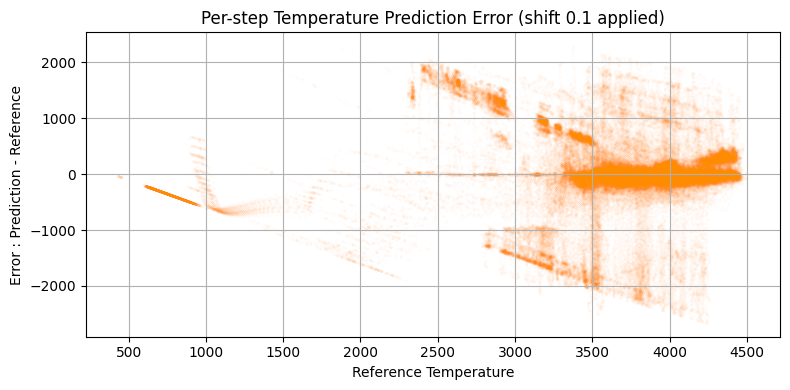

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# ── Directory of saved outputs ───────────────────────
load_dir = "/home/ftk3187/github/DPC_research/02_DED/4_policy_0725/simulation_outputs_case3_onlyshift"
laser_numbers = list(range(2, 50))

# ── 저장용 리스트 ──────────────────────────────────────
ref_temp_all = []
abs_error_all = []

for laser_num in laser_numbers:
    try:
        # Load files
        ref_path = os.path.join(load_dir, f"ref_laser_{laser_num}.csv")
        x_path   = os.path.join(load_dir, f"x_outputs_laser_{laser_num}.csv")

        ref_df = pd.read_csv(ref_path)
        x_df = pd.read_csv(x_path)

        # Extract first column (melt pool temperature)
        ref_temp = ref_df.iloc[:, 0].values
        pred_temp = x_df.iloc[:, 0].values

        # Trim to same length
        min_len = min(len(ref_temp), len(pred_temp))
        ref_temp = ref_temp[:min_len]
        pred_temp = pred_temp[:min_len]

        # Compute absolute error or squared error
        abs_error = (pred_temp - ref_temp)

        # Accumulate for all lasers
        ref_temp_all.append(ref_temp)
        abs_error_all.append(abs_error)

    except Exception as e:
        pass #print(f"❌ Error processing laser {laser_num}: {e}")

# ── Concatenate all points ────────────────────────────
ref_temp_all = np.concatenate(ref_temp_all)
abs_error_all = np.concatenate(abs_error_all)

# ── Scatter plot ──────────────────────────────────────
plt.figure(figsize=(8,4))
plt.scatter(ref_temp_all, abs_error_all, s=0.001, alpha=0.5, color='darkorange')
plt.xlabel("Reference Temperature")
plt.ylabel("Error : Prediction - Reference")
plt.title("Per-step Temperature Prediction Error (shift 0.1 applied)")
plt.grid(True)
plt.tight_layout()
plt.show()


# CASE B0 | Baseline

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import re
plt.rcParams["lines.linewidth"] = 0.7

def plot_saved_outputs(save_dir, laser_num, N_step=None):
    # Load data
    x_path = os.path.join(save_dir, f"x_outputs_laser_{laser_num}.csv")
    u_path = os.path.join(save_dir, f"u_outputs_laser_{laser_num}.csv")
    ref_path = os.path.join(save_dir, f"ref_laser_{laser_num}.csv")

    try:
        x = pd.read_csv(x_path).values
        u = pd.read_csv(u_path).values
        ref = pd.read_csv(ref_path).values.flatten()

        if N_step is None:
            N_step = min(len(x), len(u), len(ref))

        plt.figure(figsize=[8, 8])
        plt.suptitle(f"Laser Power Number: {laser_num}", fontsize=14)

        # ─── 1. Melt Pool Temperature ──────────────────────────────
        plt.subplot(3, 1, 1)
        plt.plot(x[:N_step, 0], label="GAMMA simulation")
        plt.plot(ref[:N_step], label="Reference")
        for yline in [2000, 3000, 4000]:
            plt.axhline(y=yline, color='gray', linestyle='--', linewidth=0.8)
        #plt.legend()

        plt.xlabel("MPC time step")
        plt.ylabel("Melt Pool Temp (K)")

        # ─── 2. Melt Pool Depth ───────────────────────────────────
        plt.subplot(3, 1, 2)
        plt.plot(x[:N_step, 1], label="GAMMA simulation")
        plt.axhline(y=0.225, linestyle='--', color='r', label="Upper Bound")
        plt.axhline(y=0.075, linestyle='--', color='r', label="Lower Bound")
        #plt.legend()

        plt.xlabel("MPC time step")
        plt.ylabel("Melt Pool Depth (mm)")

        # ─── 3. Laser Power ───────────────────────────────────────
        plt.subplot(3, 1, 3)
        plt.plot(u[:N_step])
        for yline in [500, 600, 700]:
            plt.axhline(y=yline, color='gray', linestyle='--', linewidth=0.8)
    
        plt.xlabel("MPC time step")
        plt.ylabel("Laser Power (W)")

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

    except Exception as e:
        print(f"❌ Failed to plot for laser {laser_num}: {e}")



📌 Found laser_power_numbers: [1]


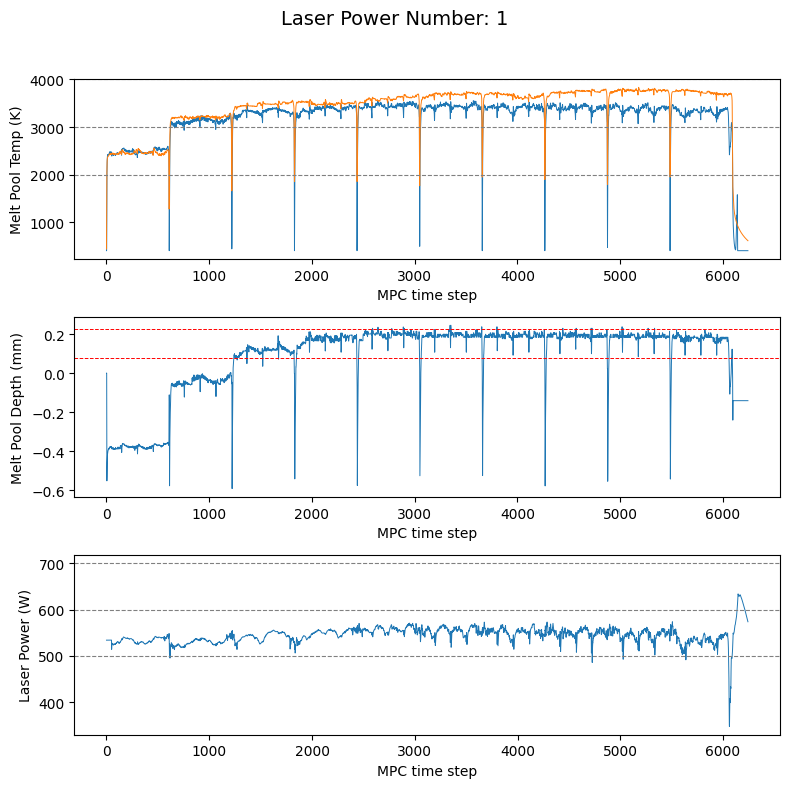

In [3]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/3L_1024H_s1_c5_ep50_roll10_m102400_aug/simulation/policy_model_best"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

# B0

📌 Found laser_power_numbers: [27, 28, 29]


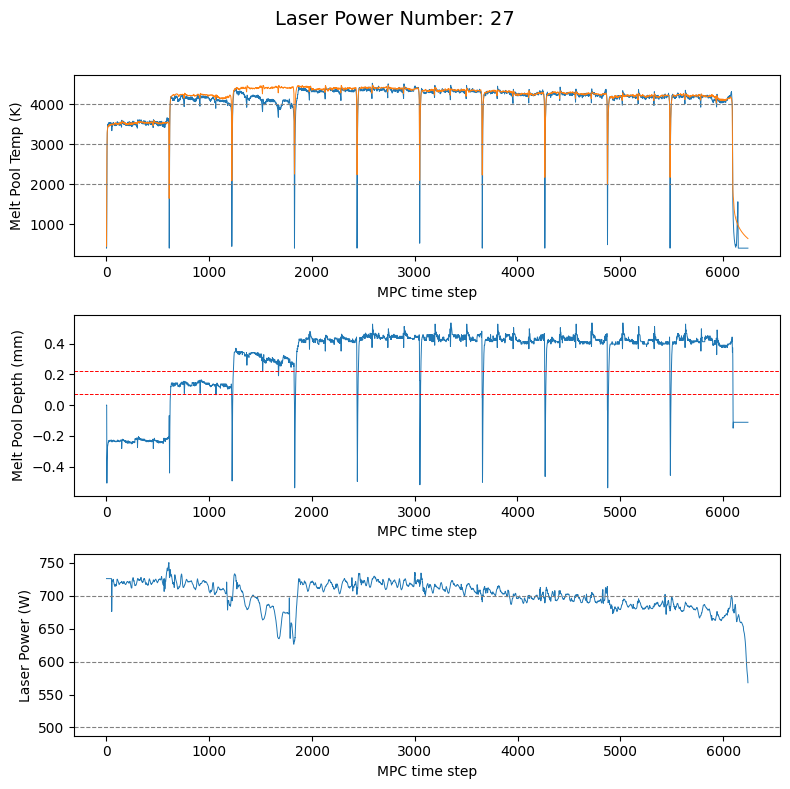

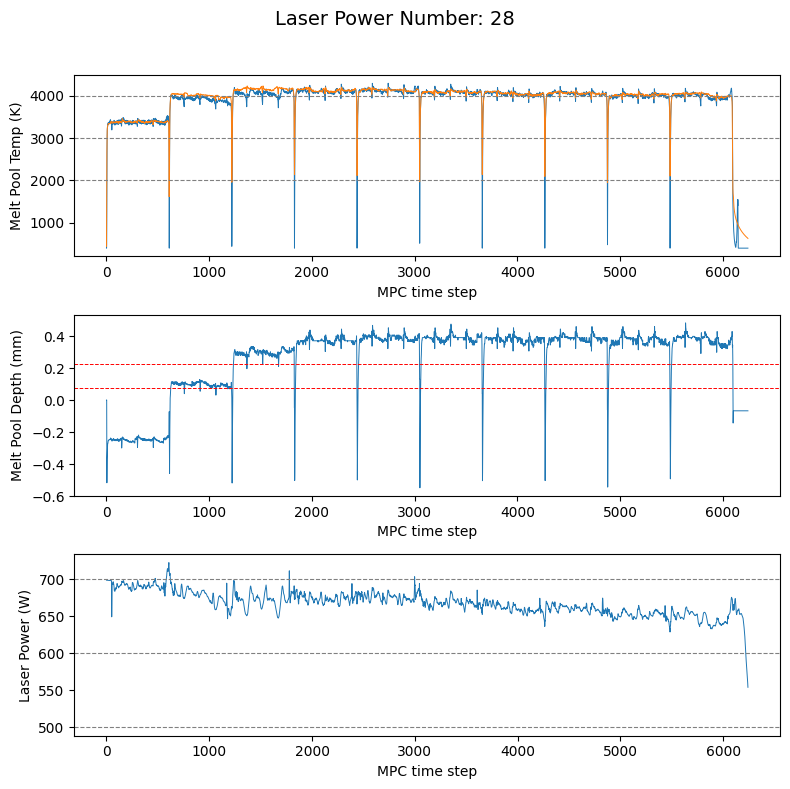

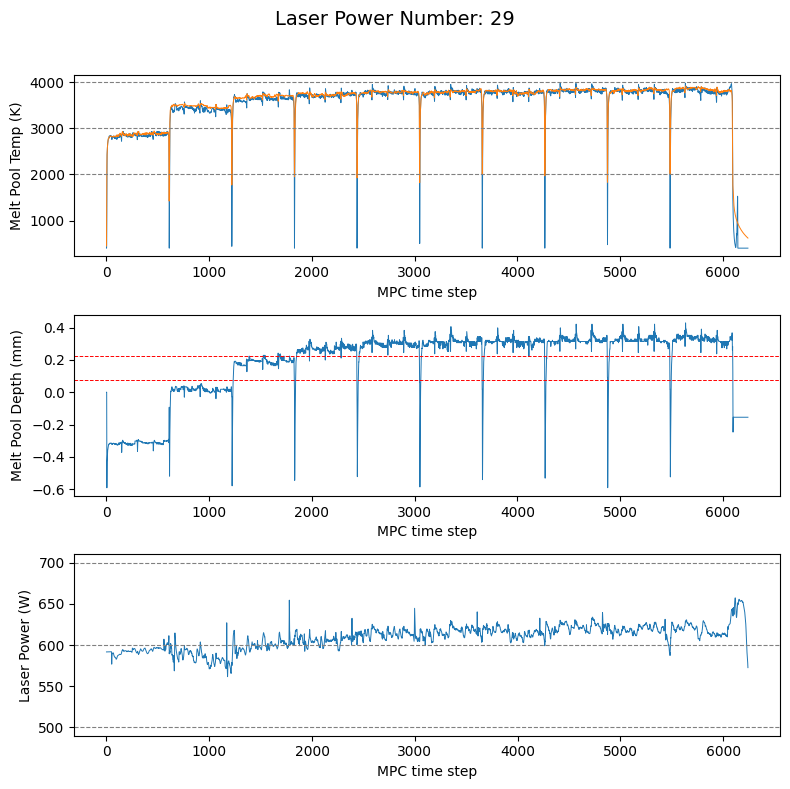

In [5]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/policy_model_discreteshift_3L_1024H_s1_c0_case19/simulation"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

## nomc_base

📌 Found laser_power_numbers: [1, 2]


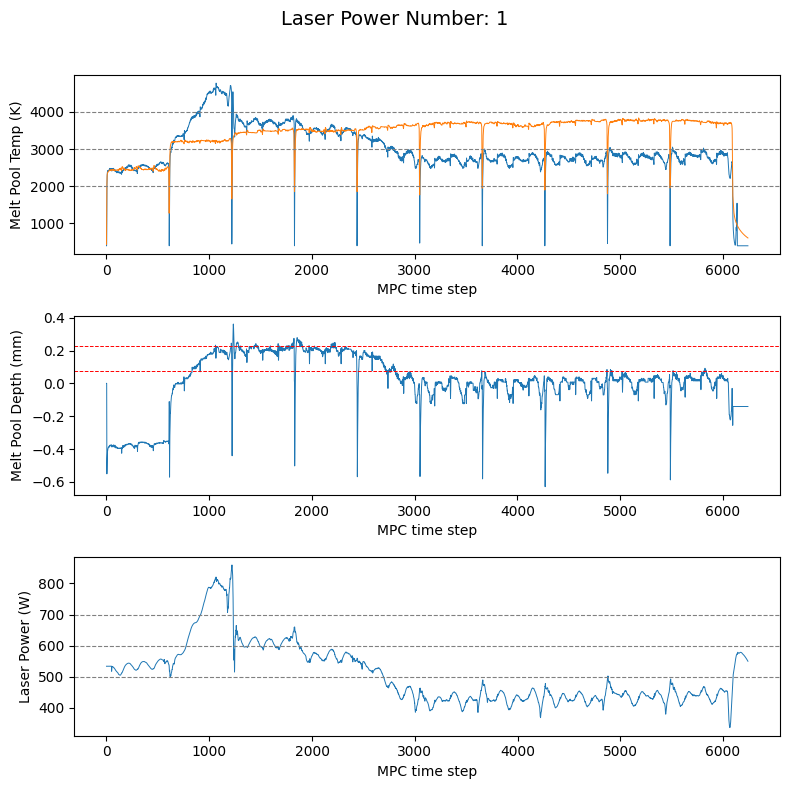

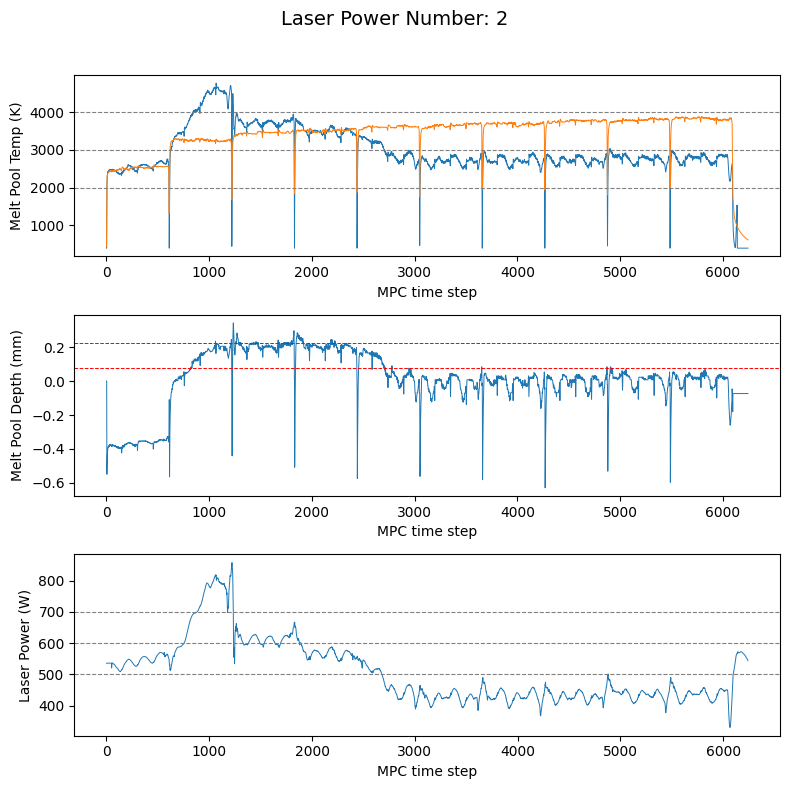

In [4]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/lam0.1_nomc_3L_1024H_s1_c3_ep50_roll10_m102400_base_x/simulation/policy_roll_epoch0039"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

## nomc_aug

📌 Found laser_power_numbers: [1, 2]


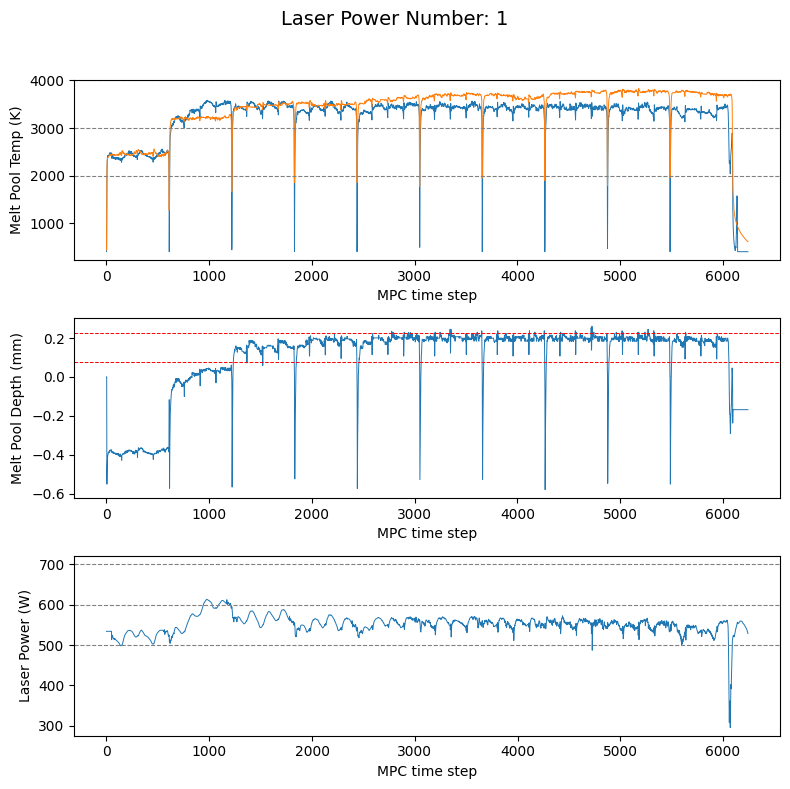

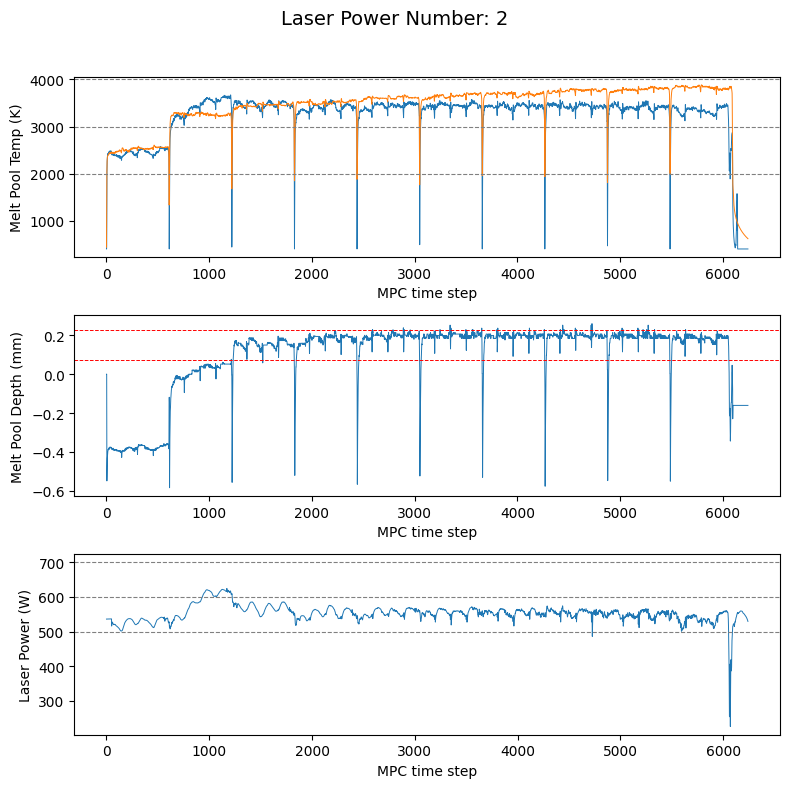

In [14]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/lam0.05_nomc_3L_1024H_s1_c3_ep50_roll10_m102400_aug_x/simulation/policy_roll_epoch0029"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

## noquantile_aug

📌 Found laser_power_numbers: [1, 2, 3, 4]


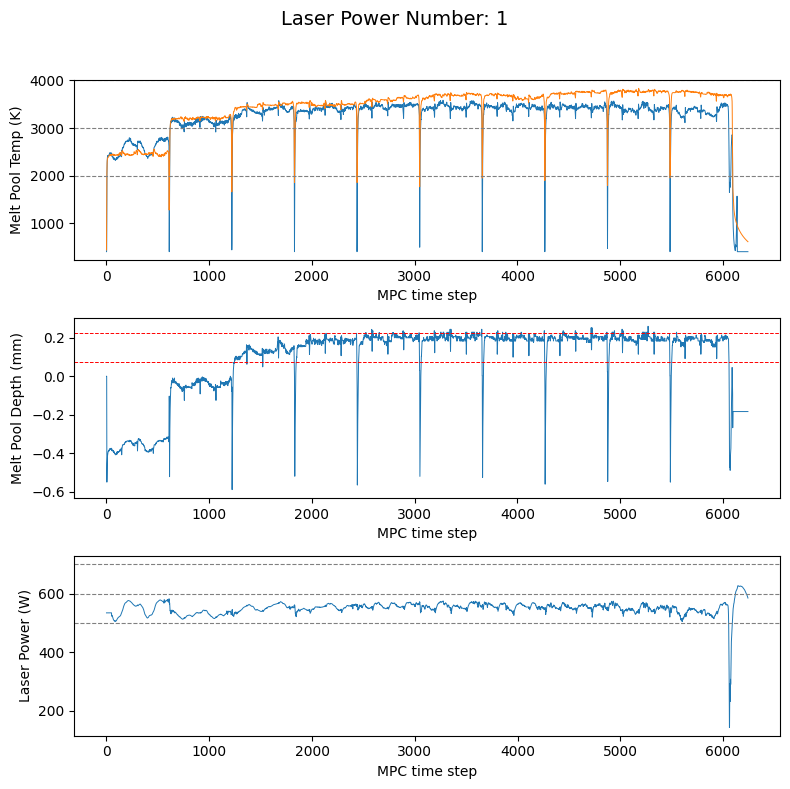

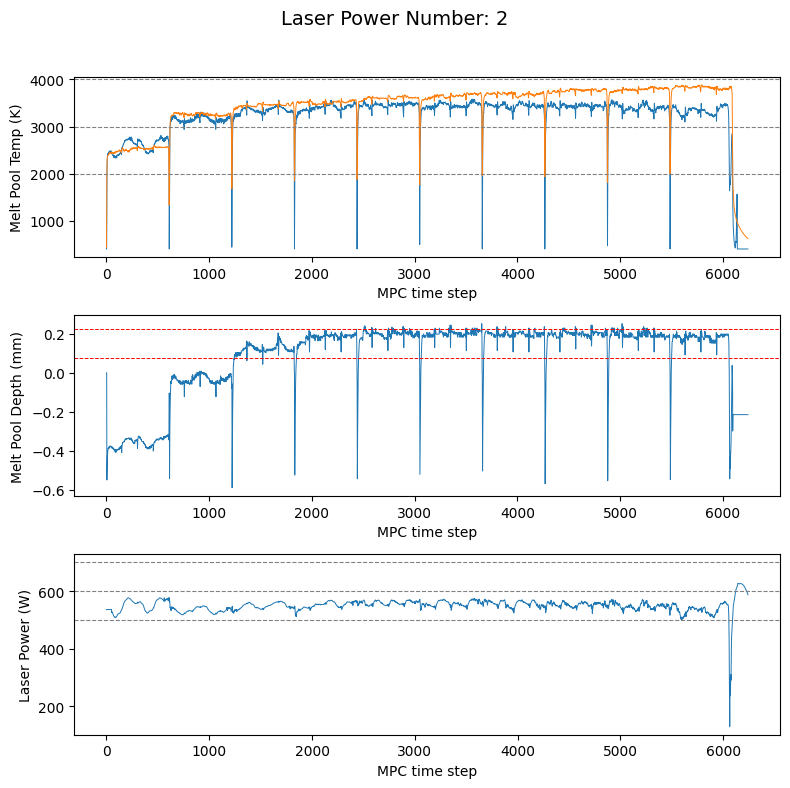

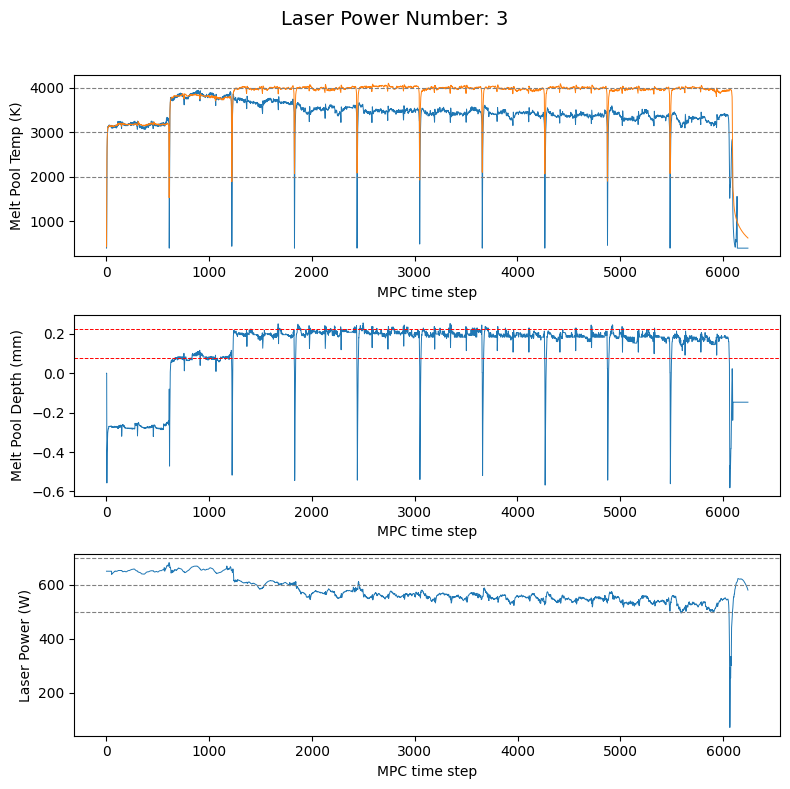

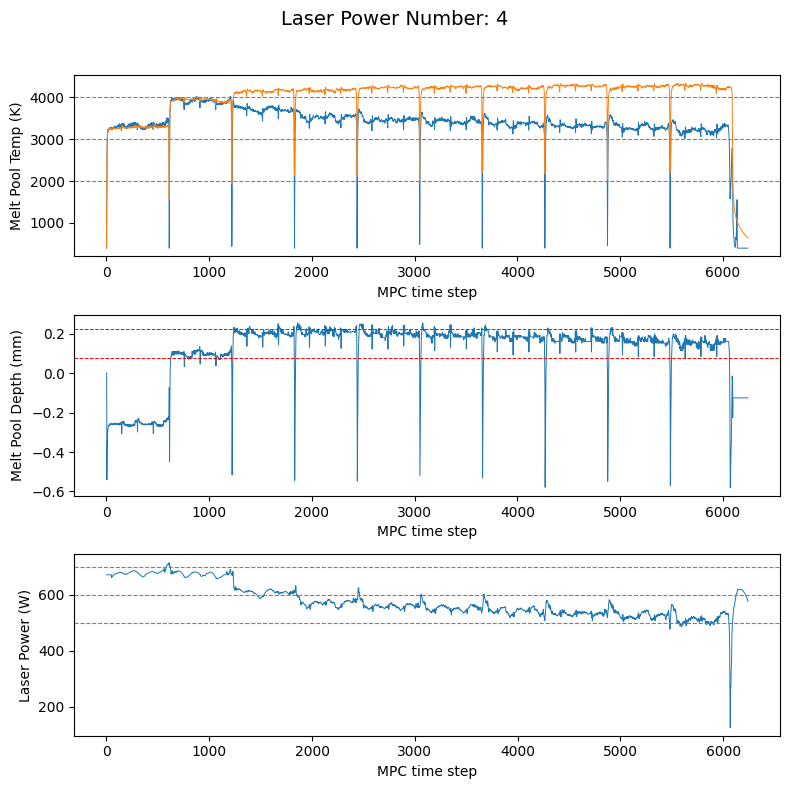

In [2]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/lam0.01_noquantile_3L_1024H_s1_c3_ep50_roll10_m102400_aug/simulation/policy_model_best."

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

📌 Found laser_power_numbers: [1]


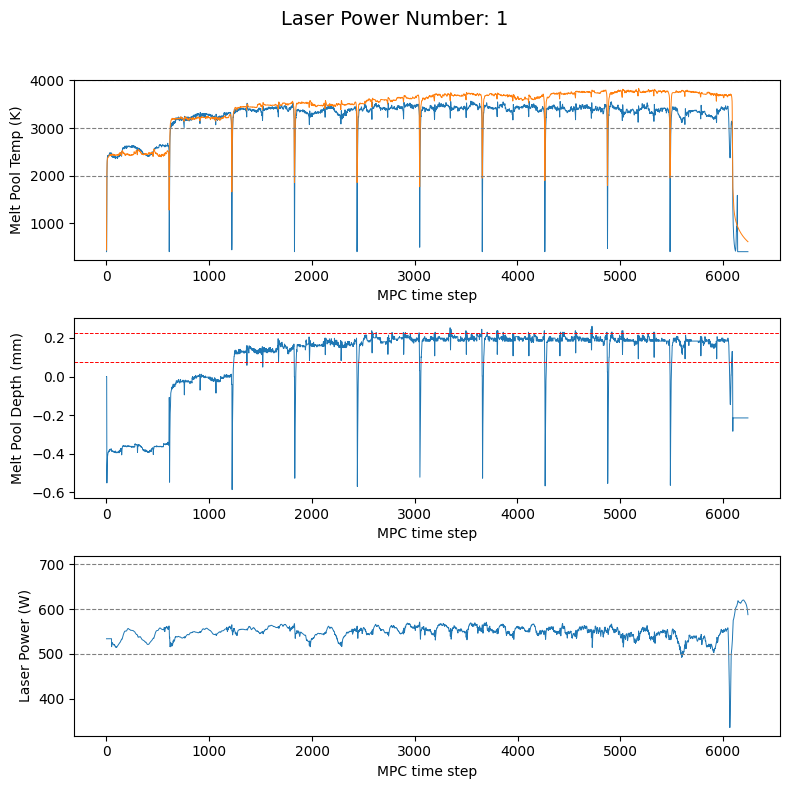

In [2]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/lam0.03_noquantile_3L_1024H_s1_c3_ep50_roll10_m102400_aug/simulation/policy_roll_epoch0019"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

## both_base

📌 Found laser_power_numbers: [1, 2]


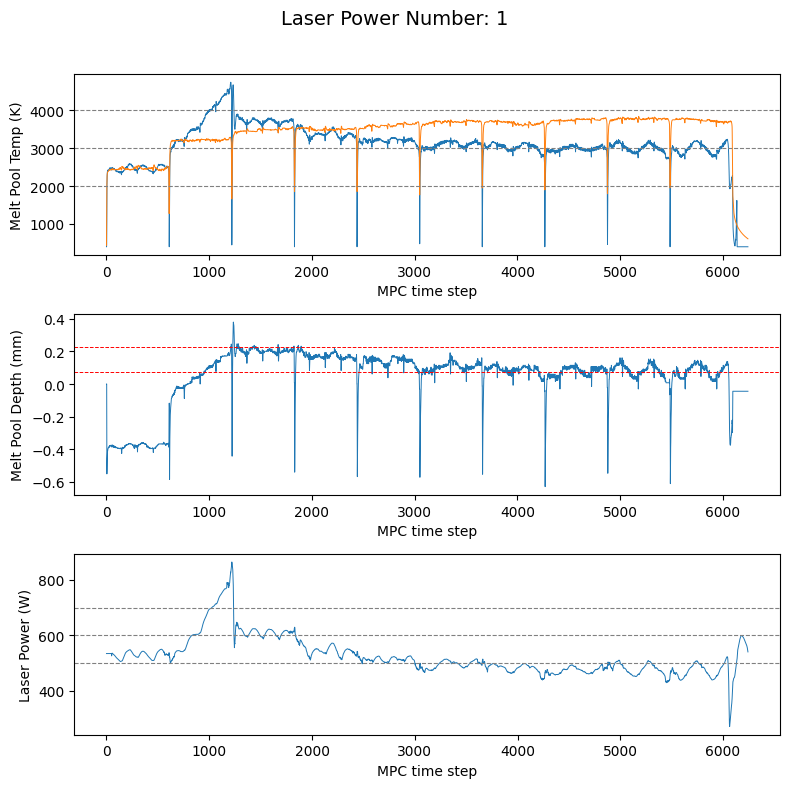

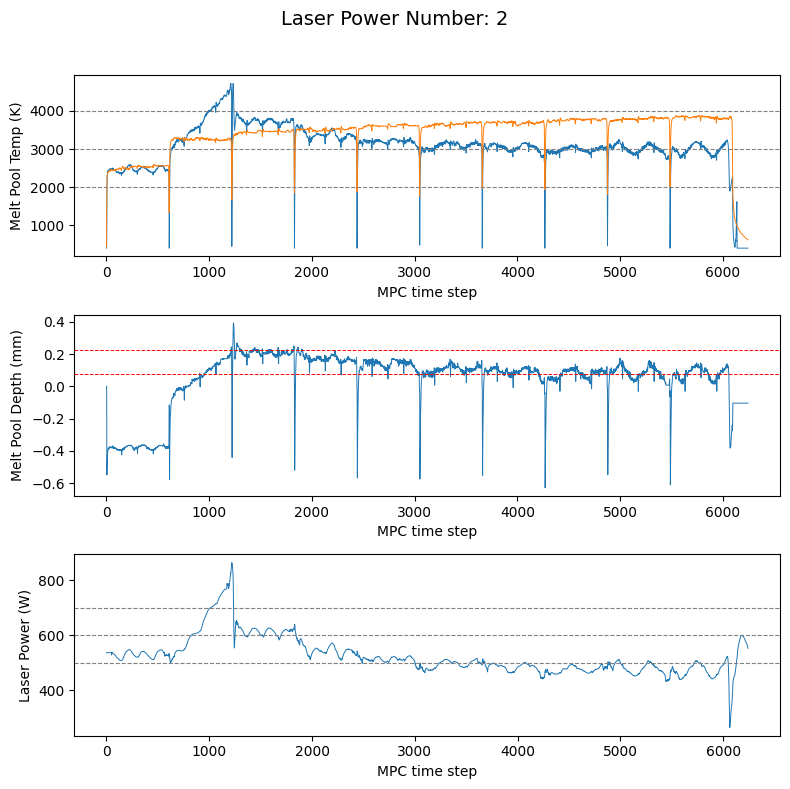

In [6]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/lam0.1_3L_1024H_s1_c3_ep50_roll10_m102400_base_x/simulation/policy_roll_epoch0009"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

## both_base_0.01

📌 Found laser_power_numbers: [1]


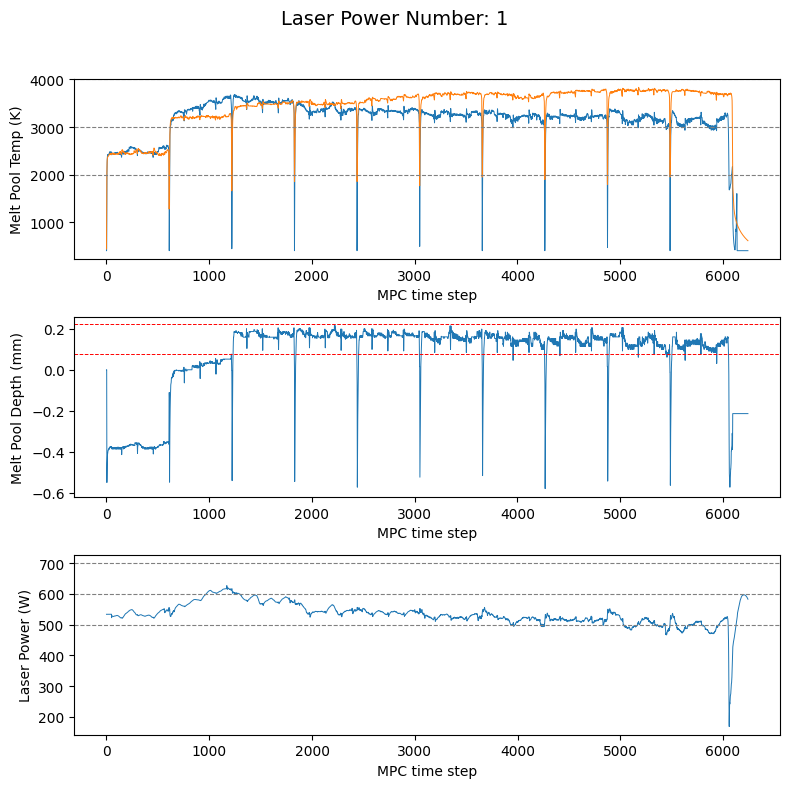

In [9]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/lam0.01_3L_1024H_s1_c3_ep50_roll10_m102400_base_x/simulation/policy_roll_epoch0039"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

## both_aug

In [ ]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/lam0.1_3L_1024H_s1_c3_ep50_roll10_m102400_aug/simulation/policy_roll_epoch0019"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

📌 Found laser_power_numbers: [1, 2, 3, 4]


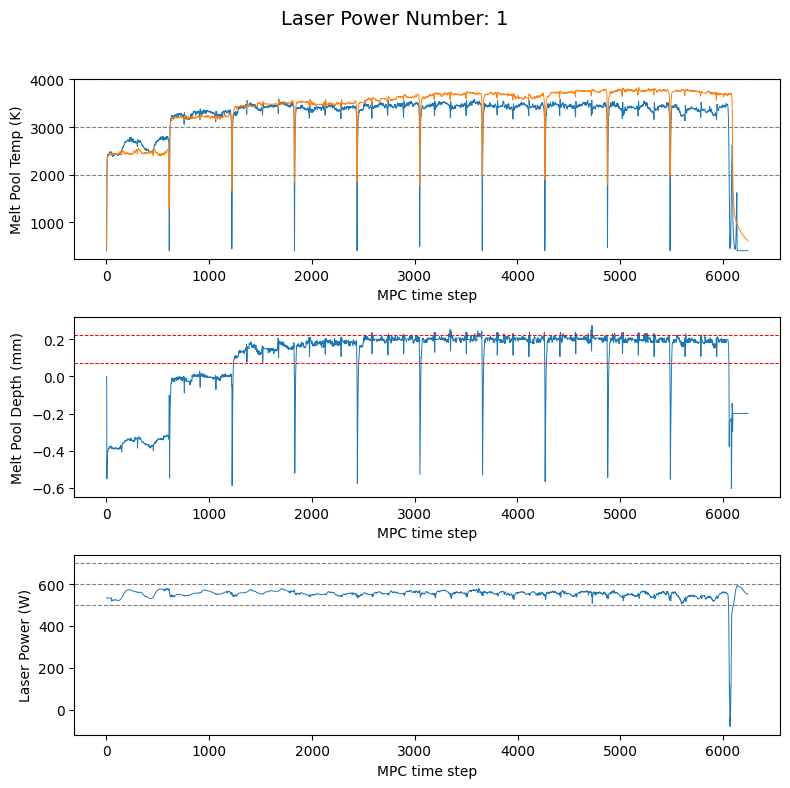

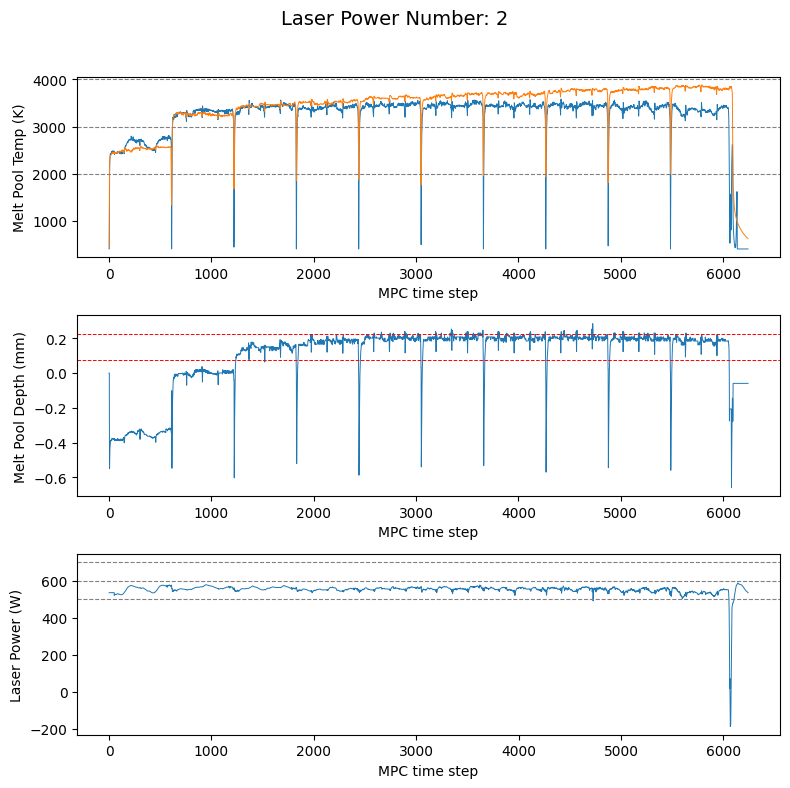

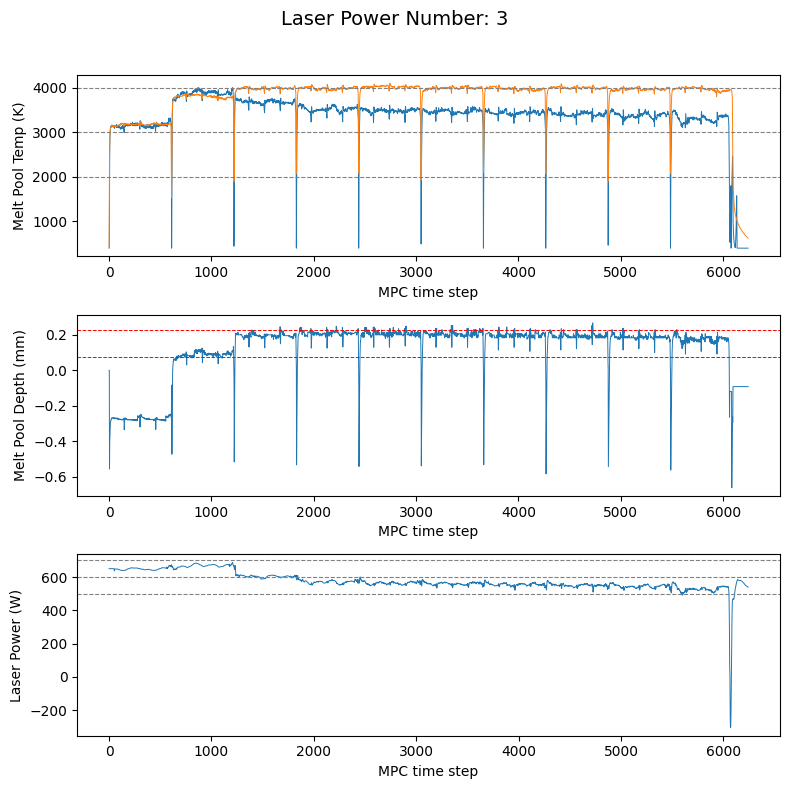

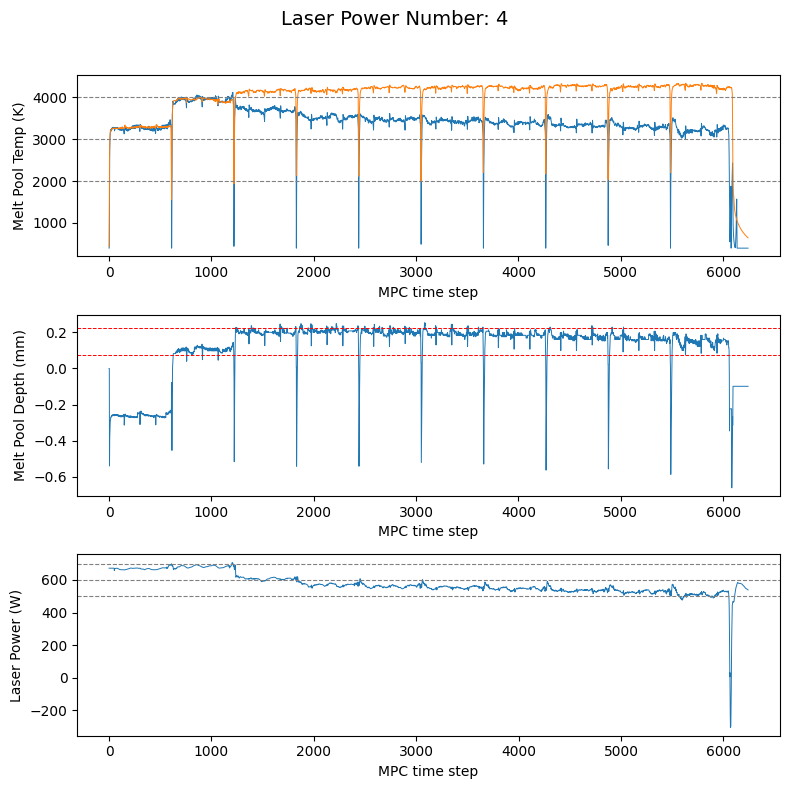

In [3]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/lam0.01_3L_1024H_s1_c3_ep50_roll10_m102400_aug/simulation/policy_model_best"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

## idetc_discrete_shift

📌 Found laser_power_numbers: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


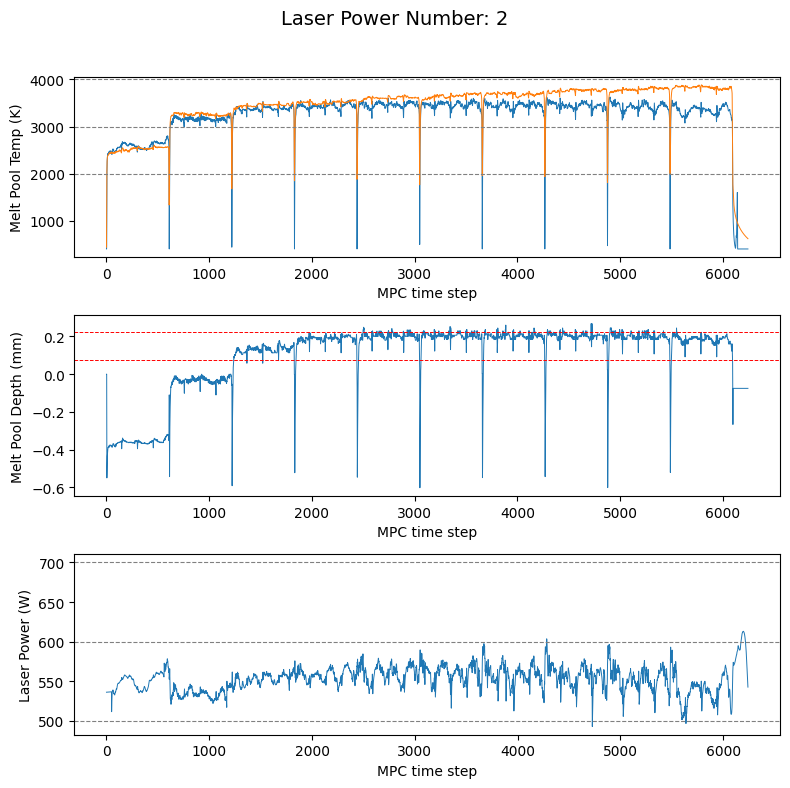

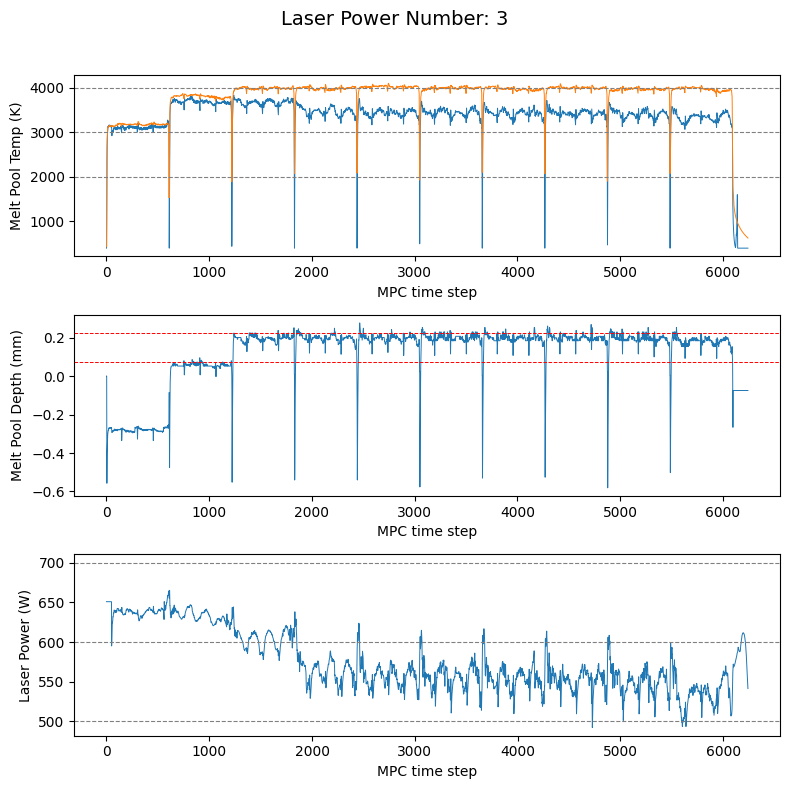

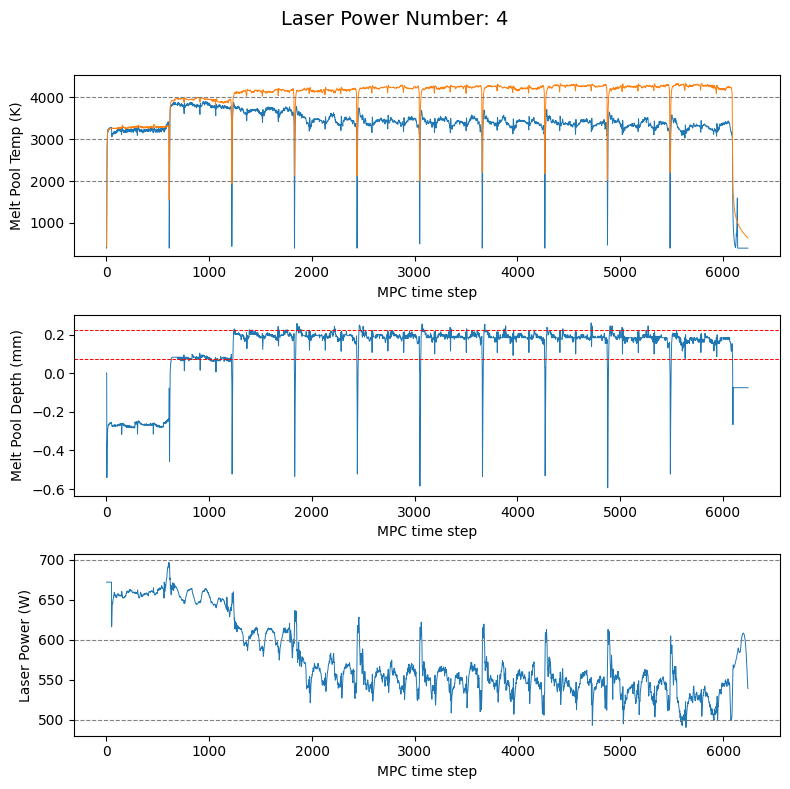

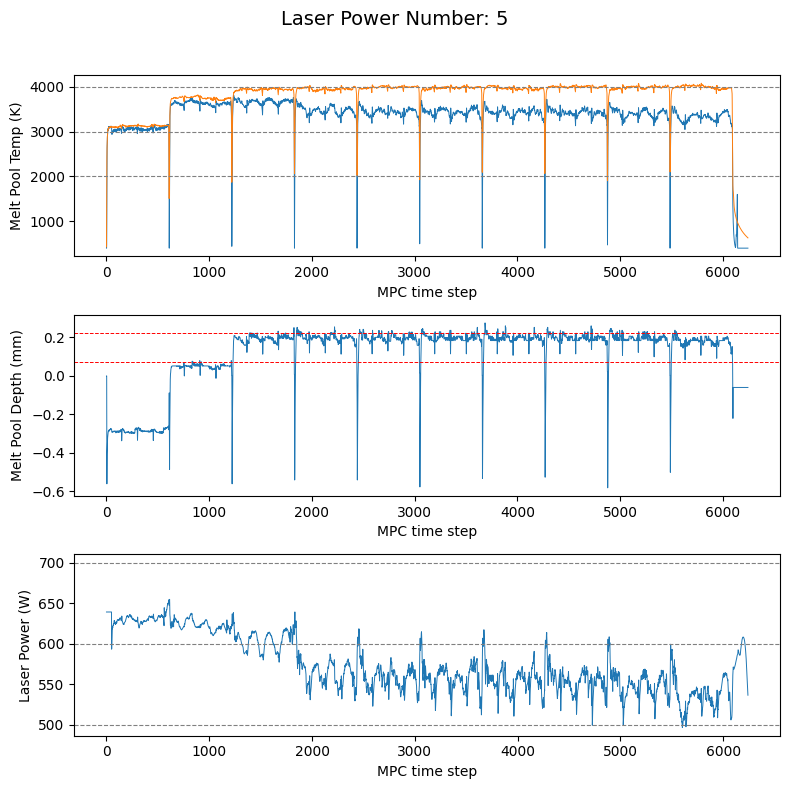

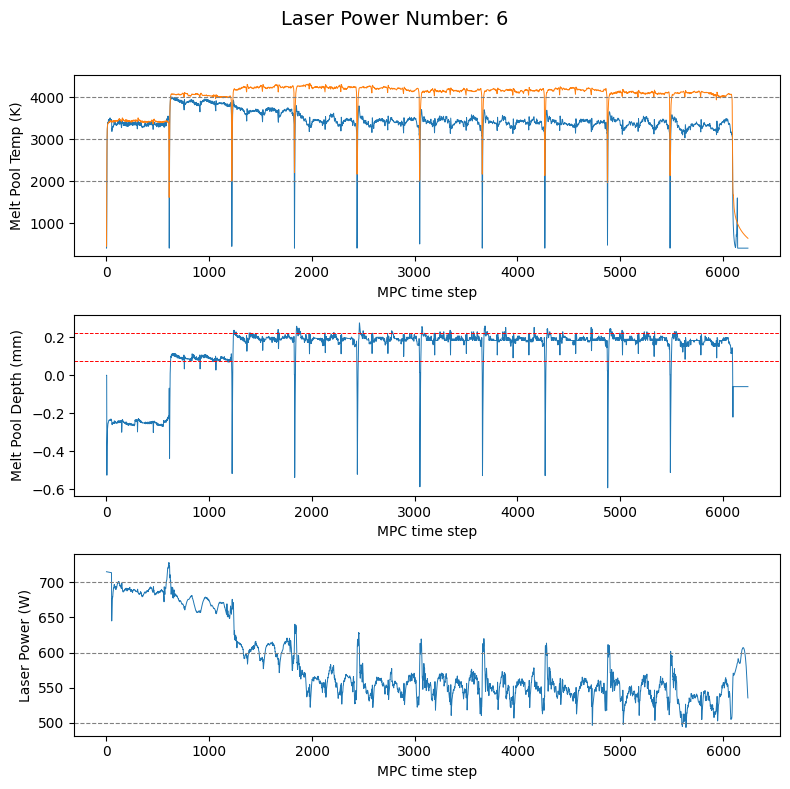

...

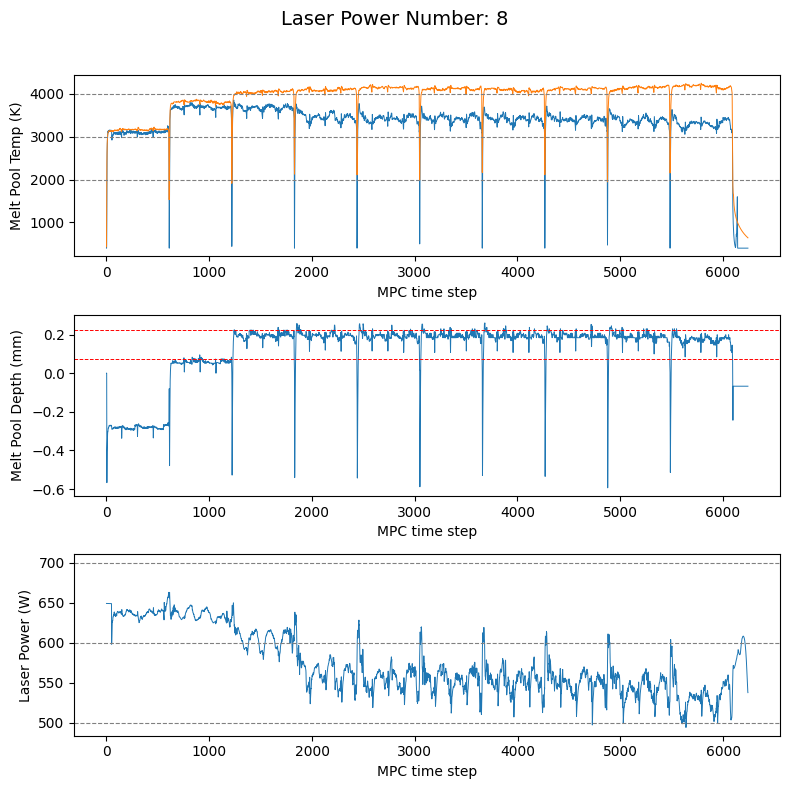

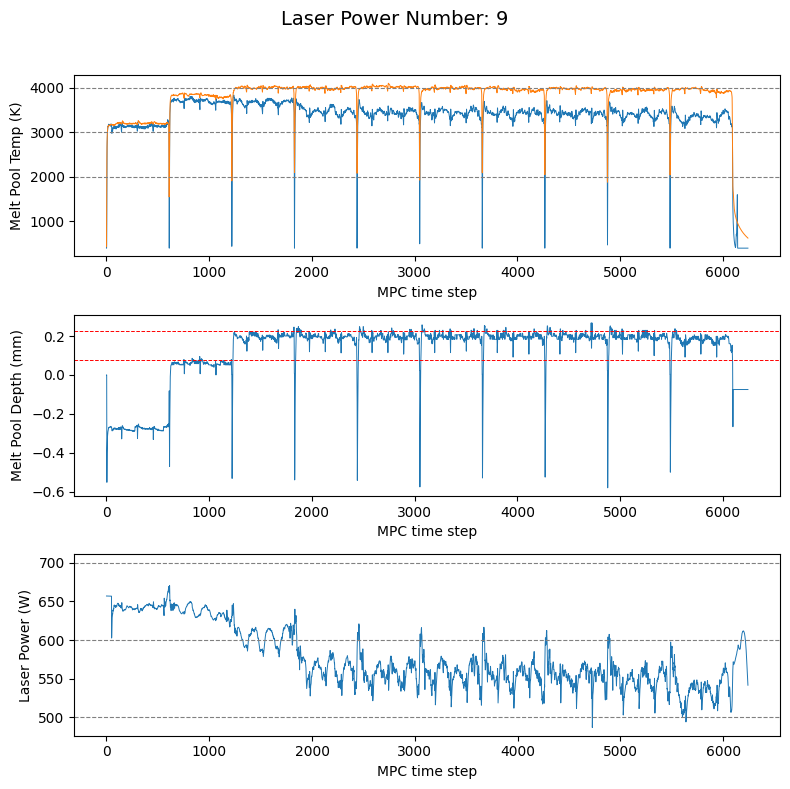

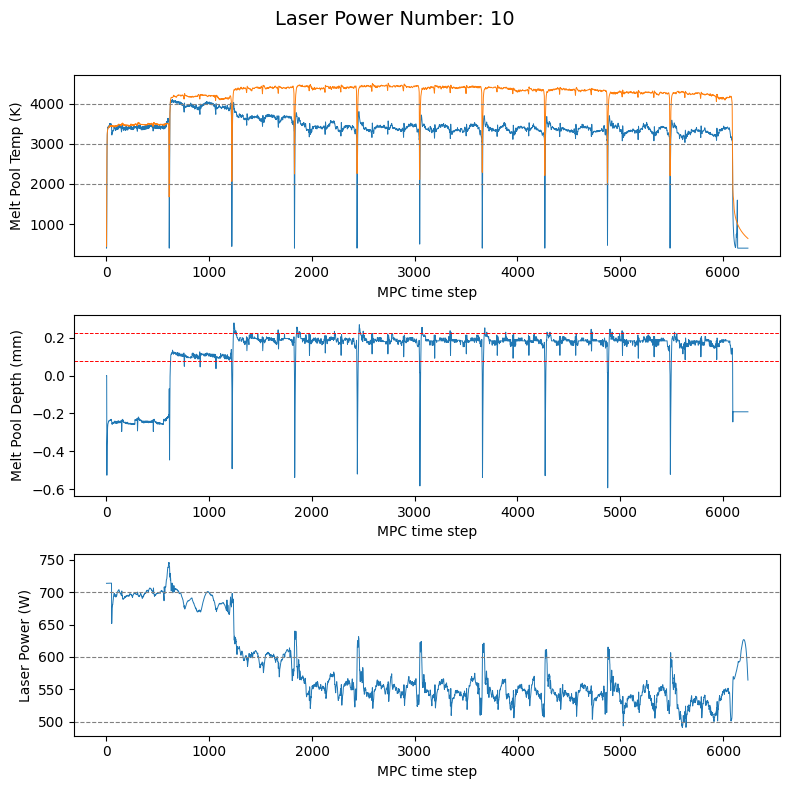

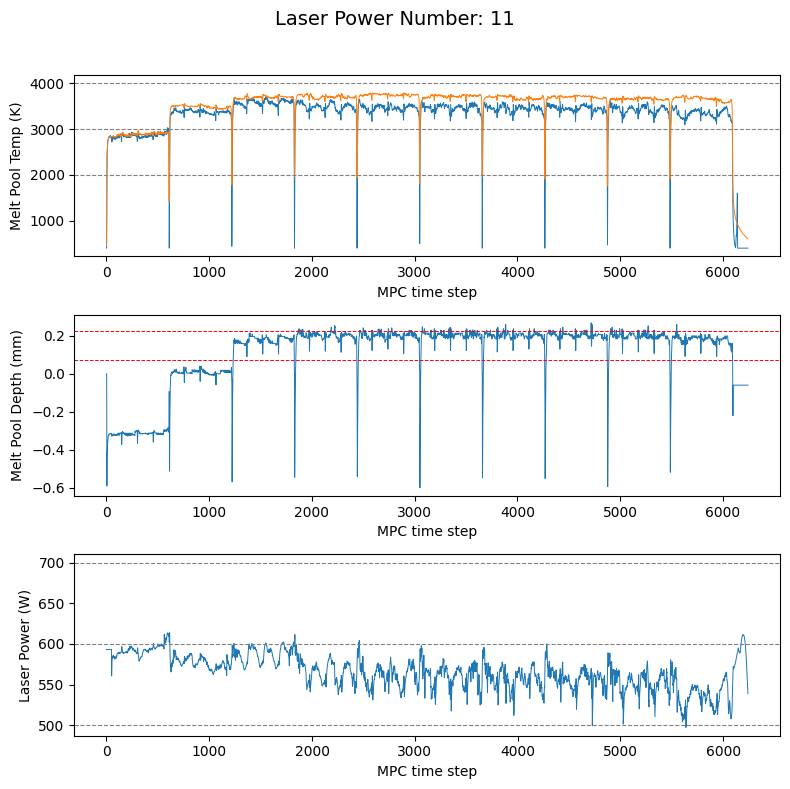

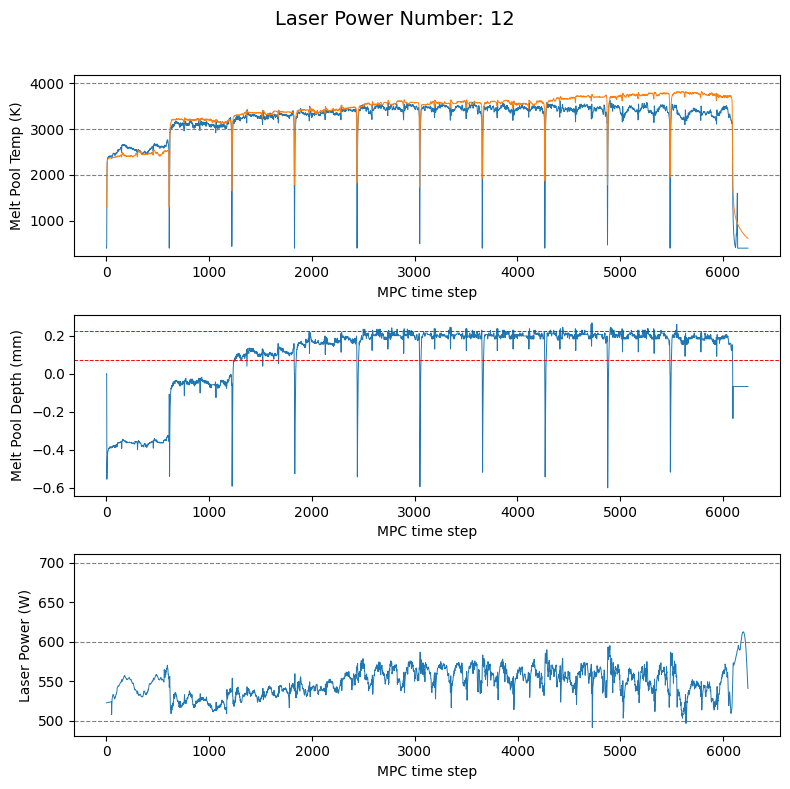

In [7]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/6_policy_0108/experiments/baseline_shift/3L_1024H_s1_c3_ep20_roll10_m1024_base/simulation"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

## aug (current best)

📌 Found laser_power_numbers: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]


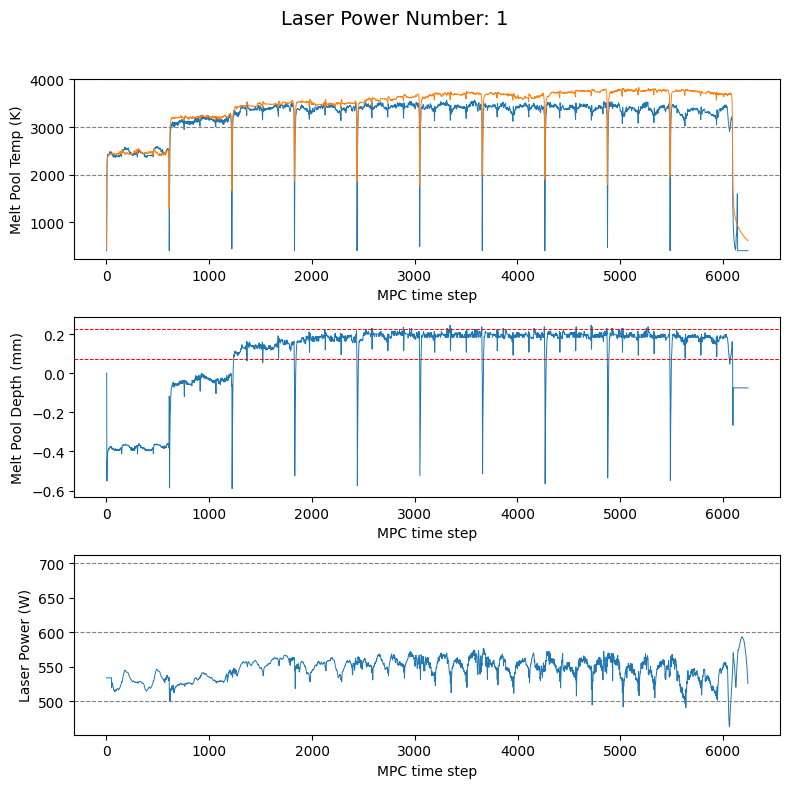

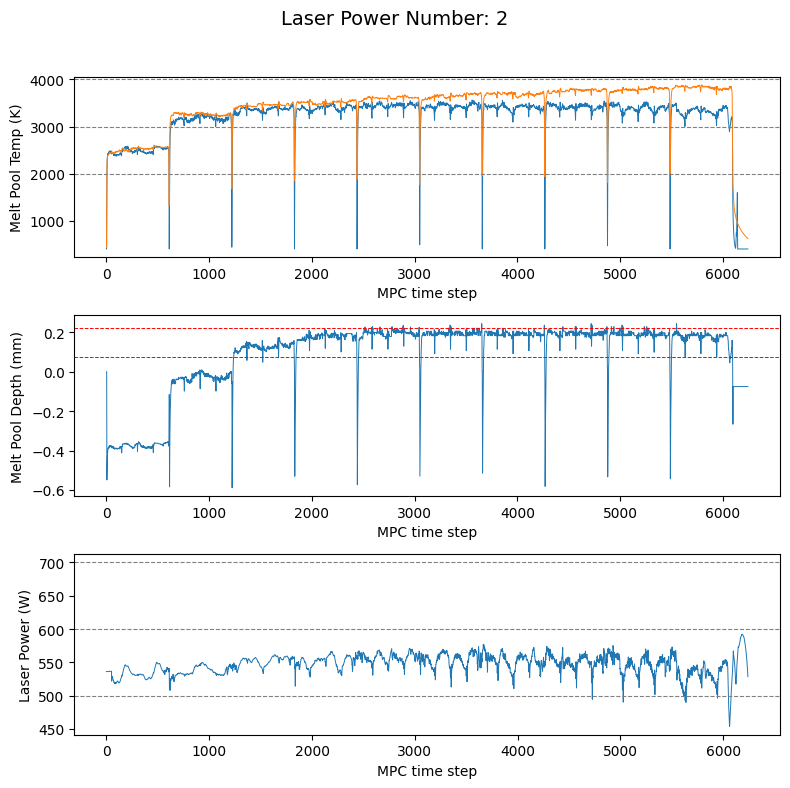

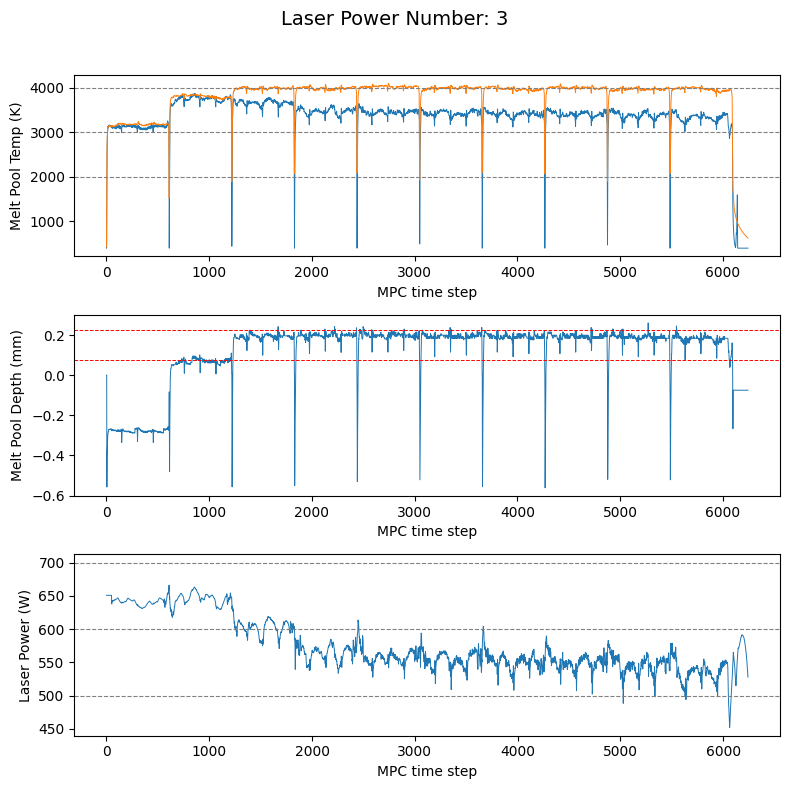

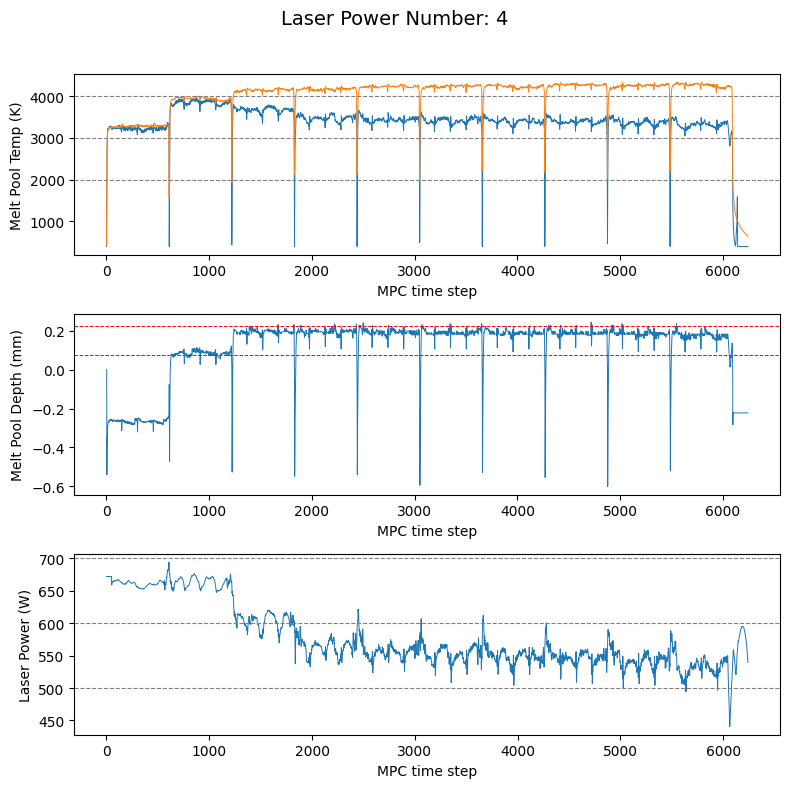

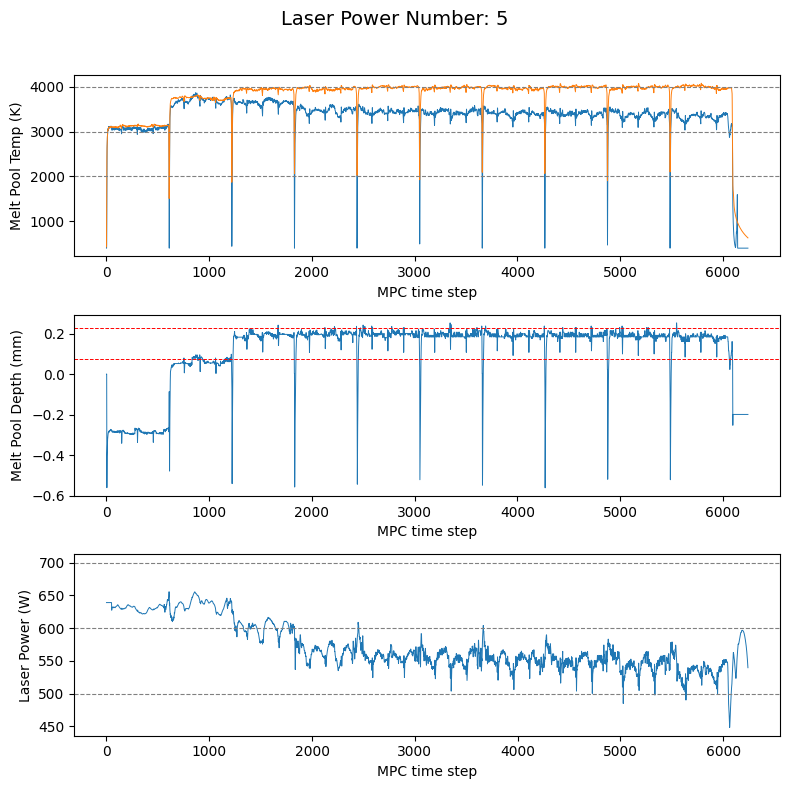

...

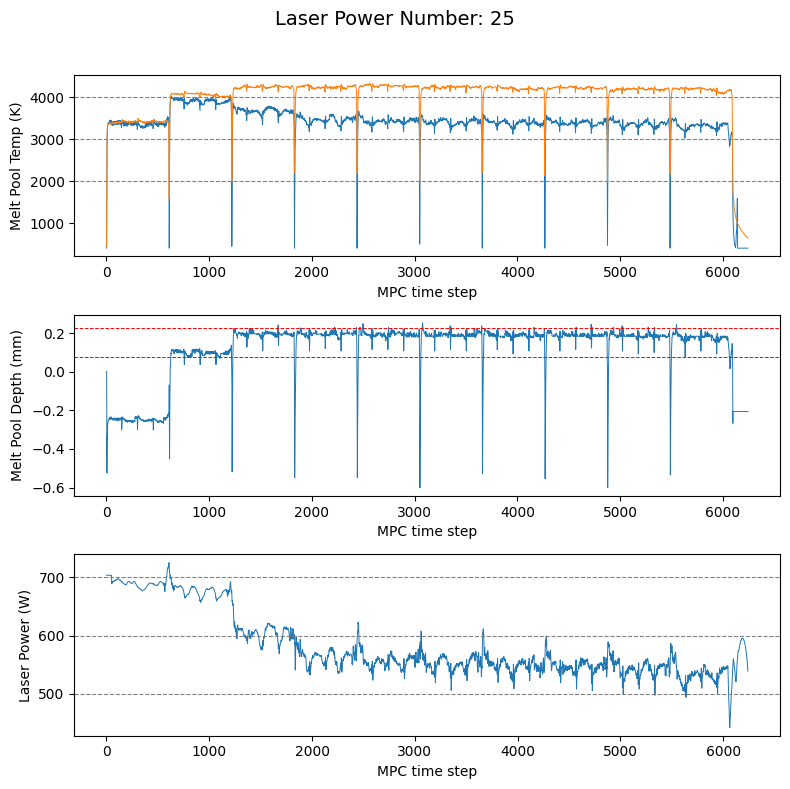

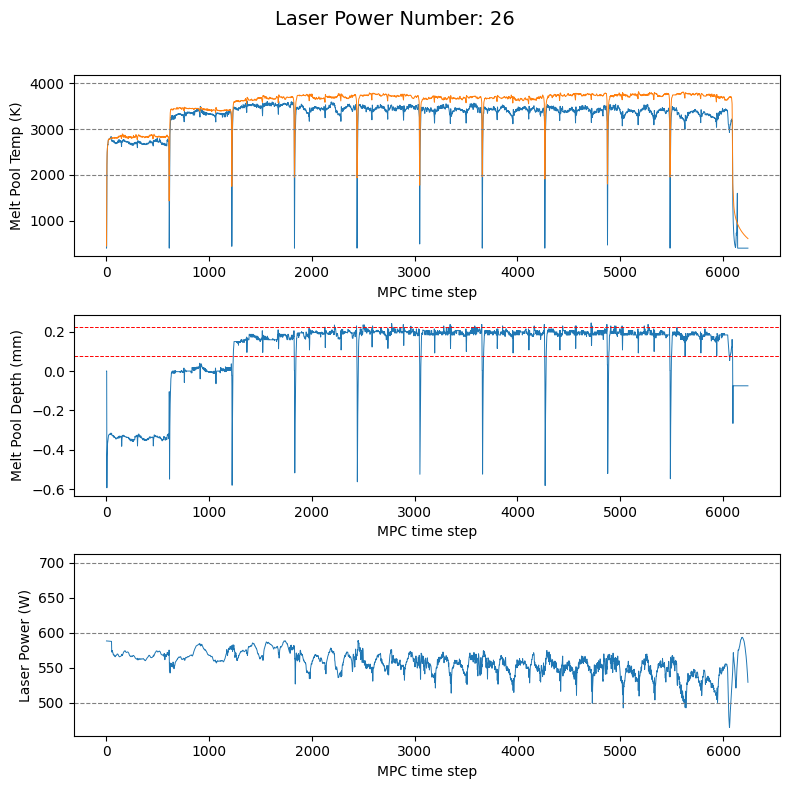

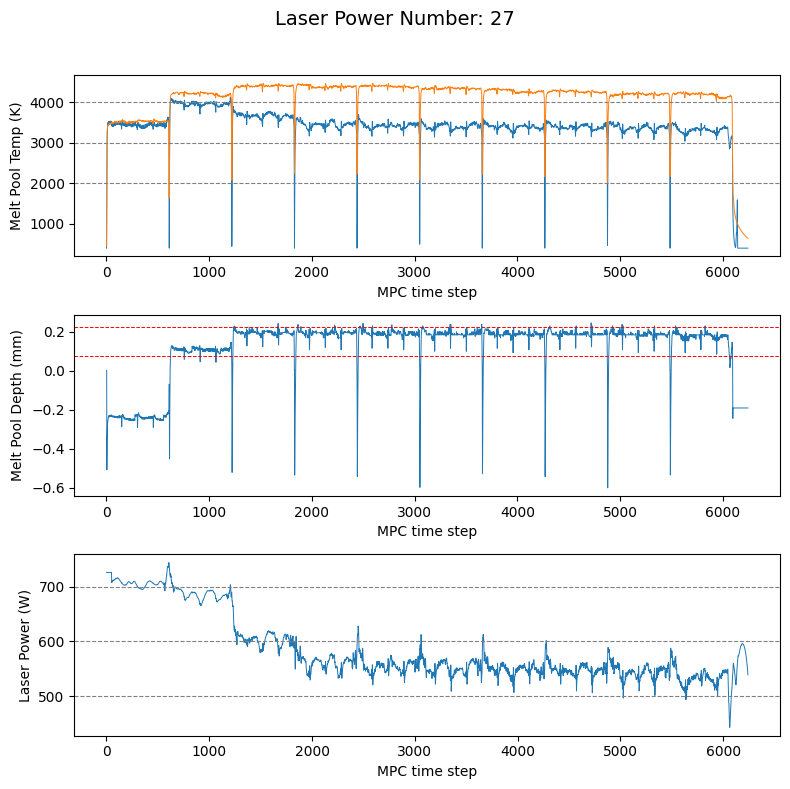

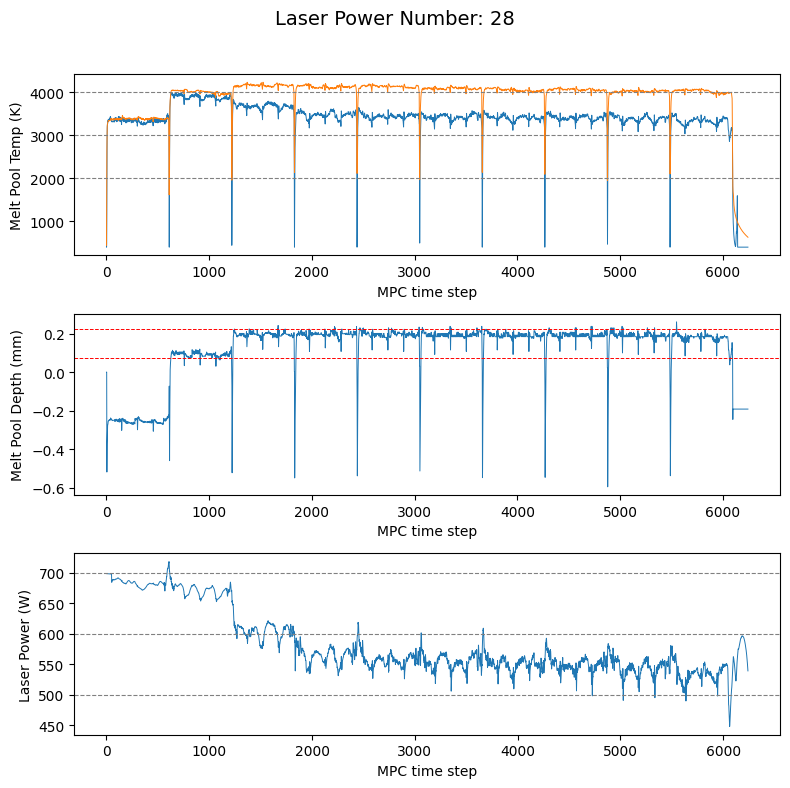

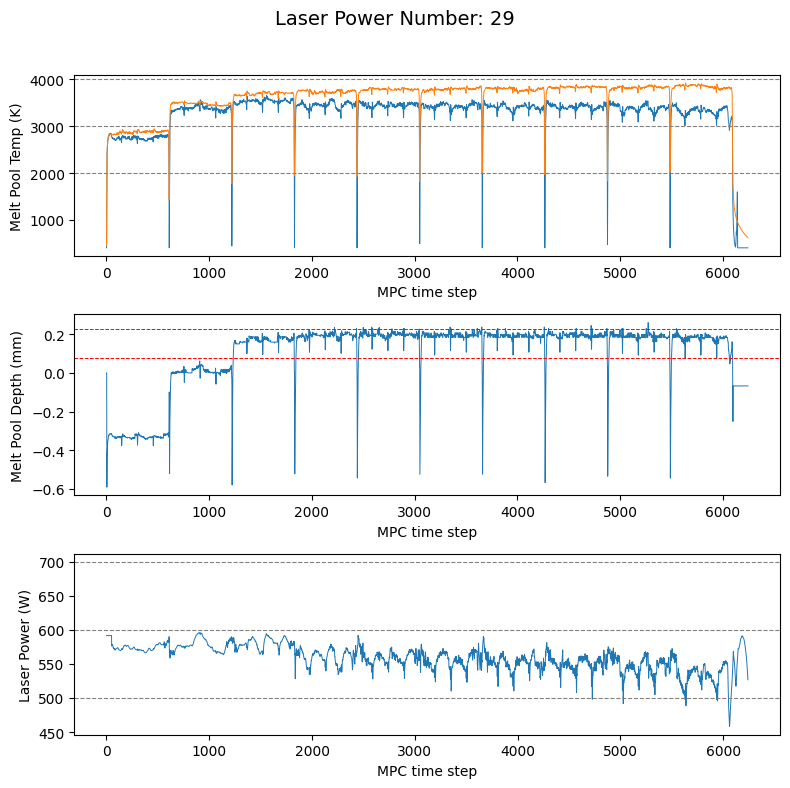

In [ ]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/3L_1024H_s1_c3_ep50_roll10_m102400_aug/simulation"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

📌 Found laser_power_numbers: [1]


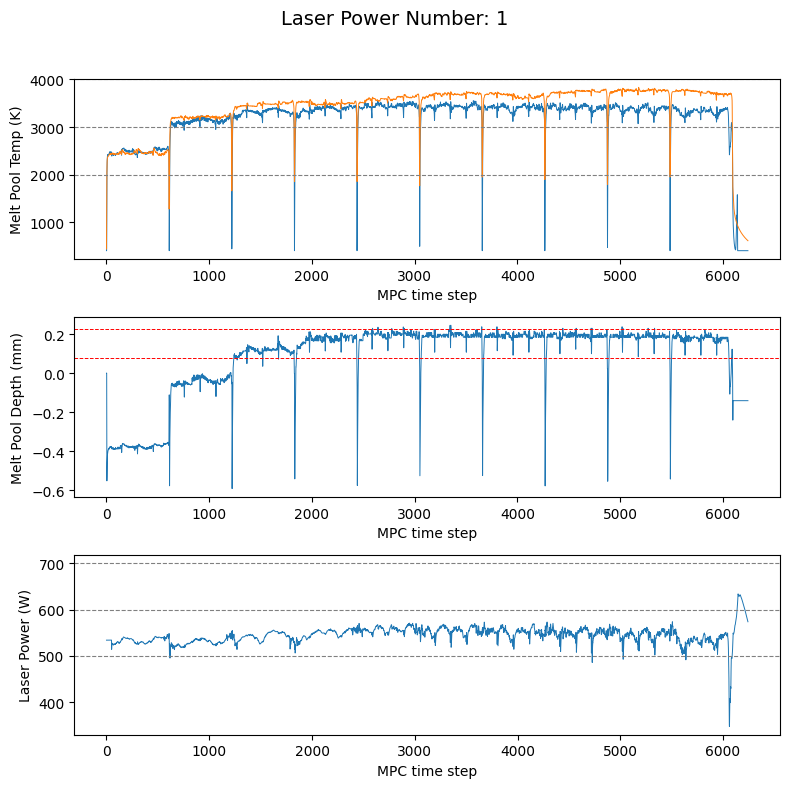

In [5]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/3L_1024H_s1_c5_ep50_roll10_m102400_aug/simulation/policy_model_best"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

📌 Found laser_power_numbers: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]


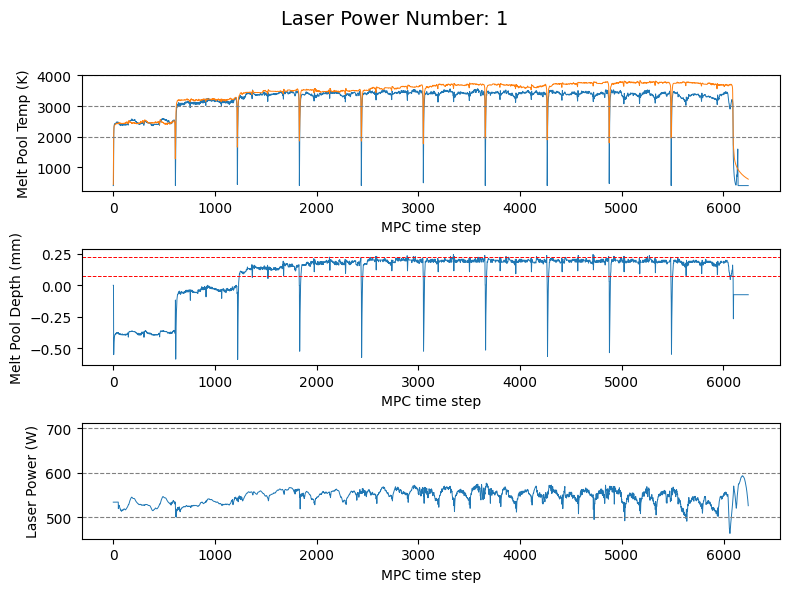

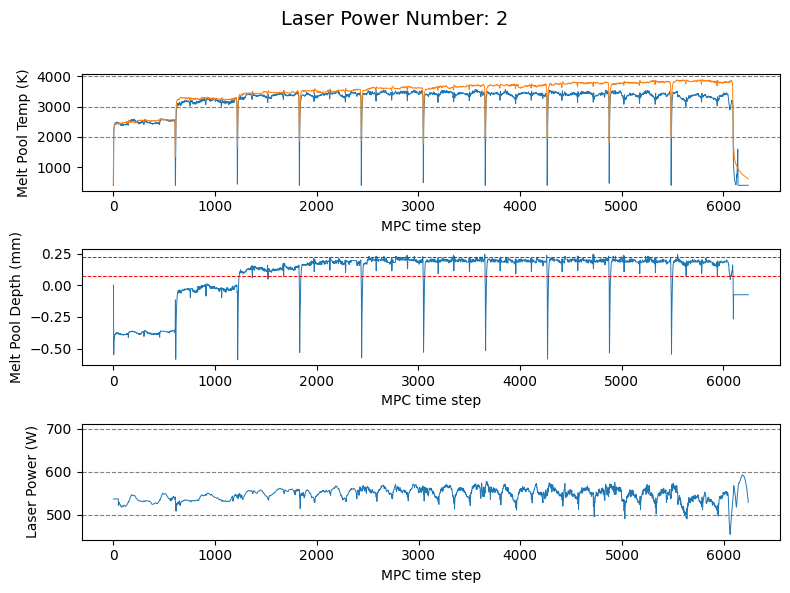

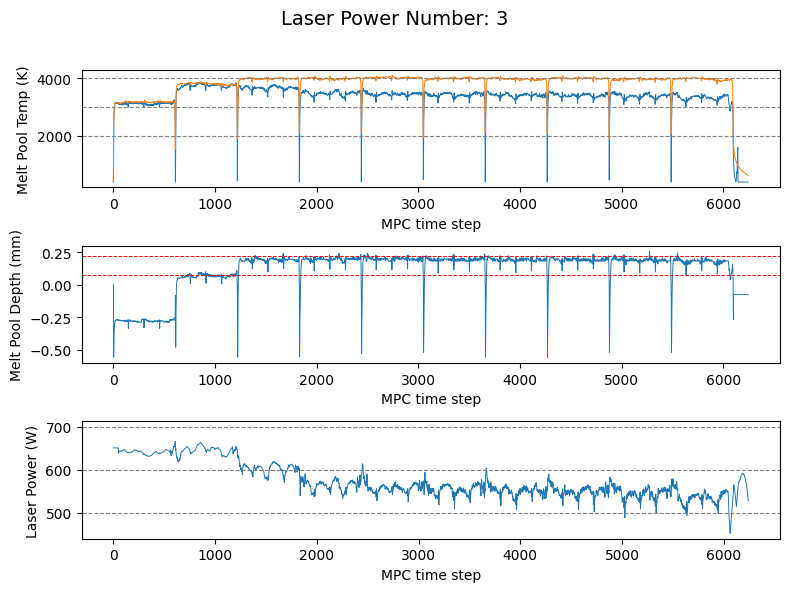

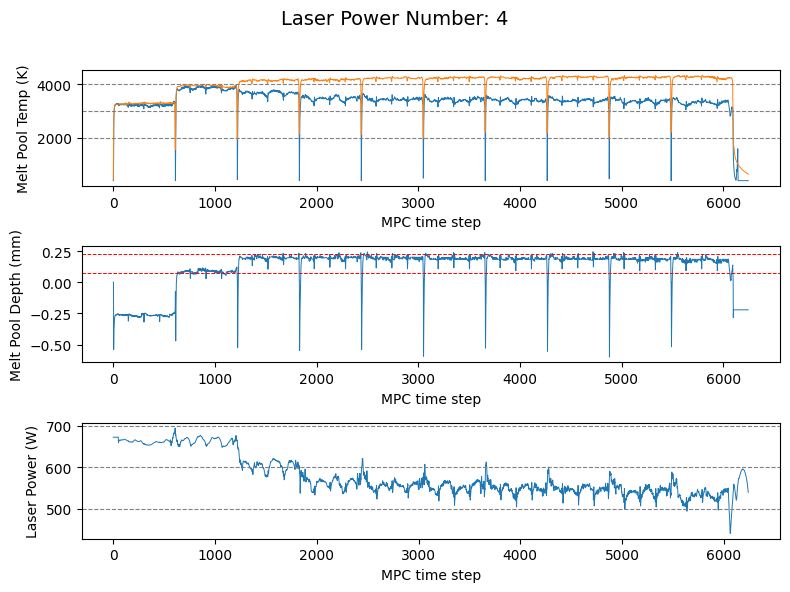

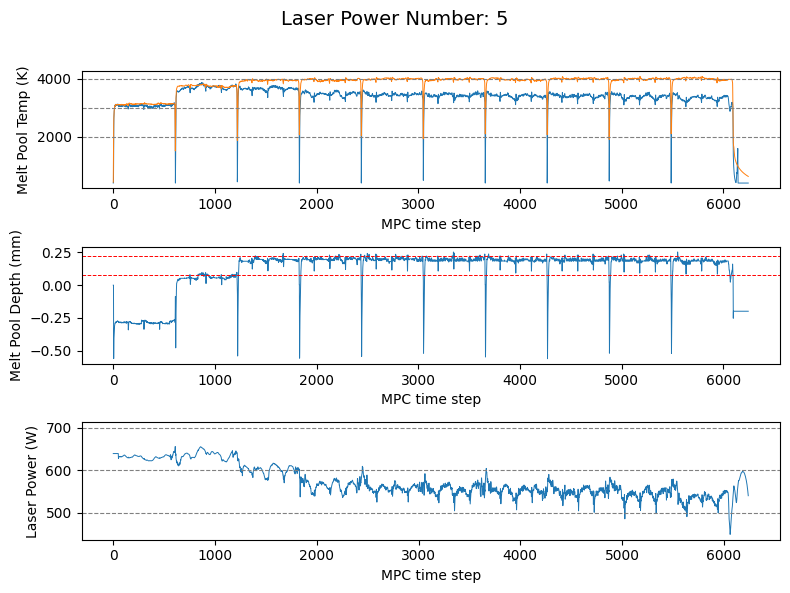

...

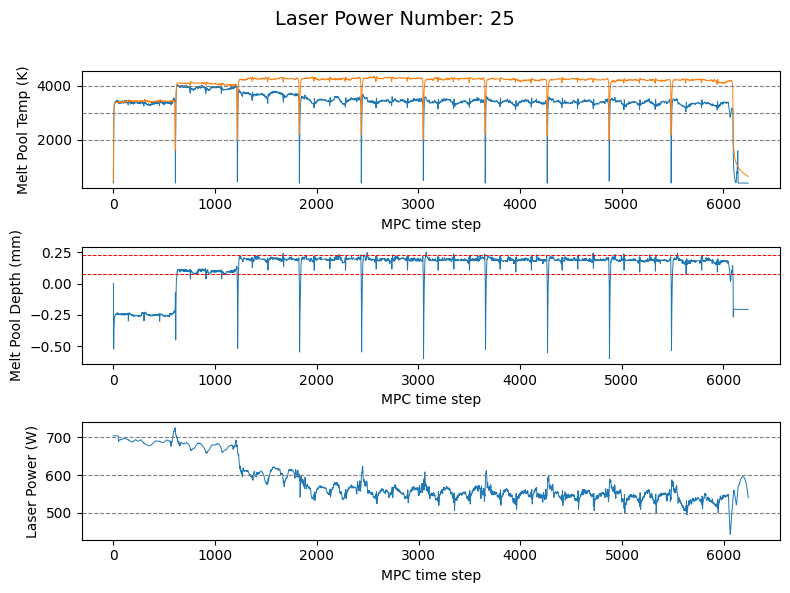

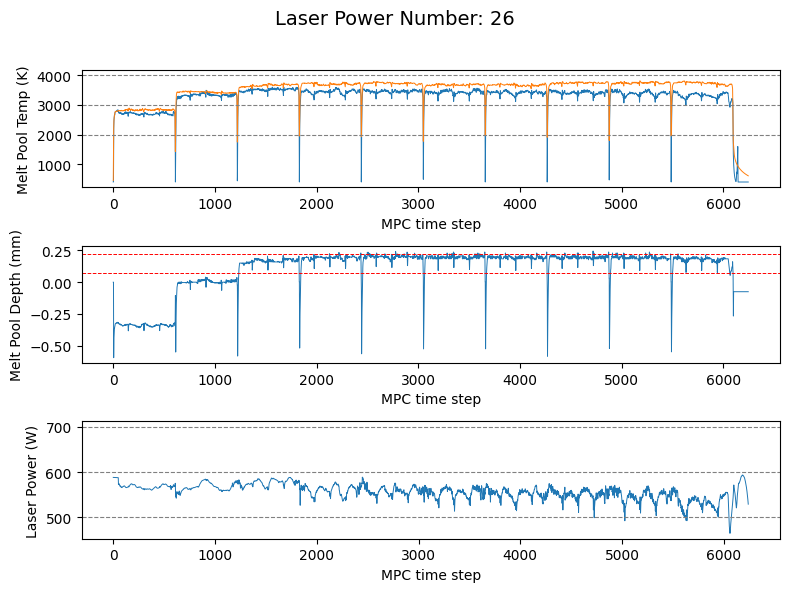

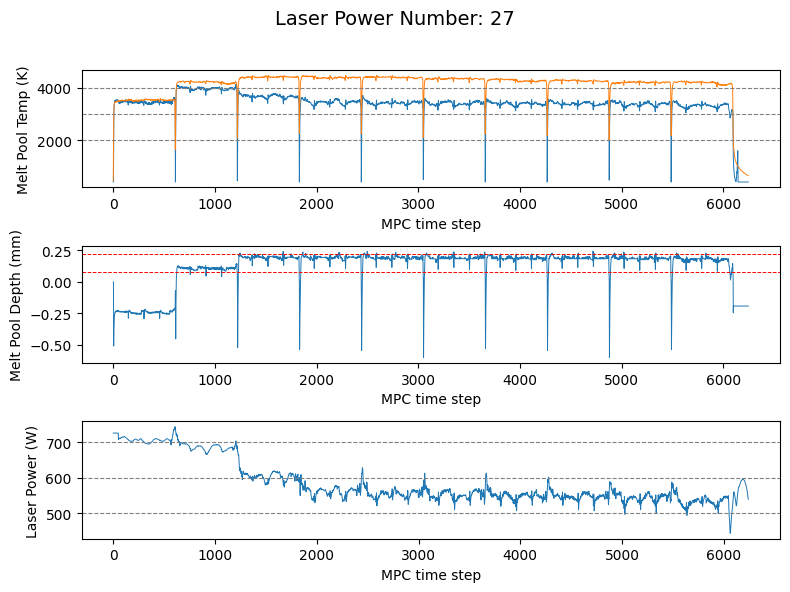

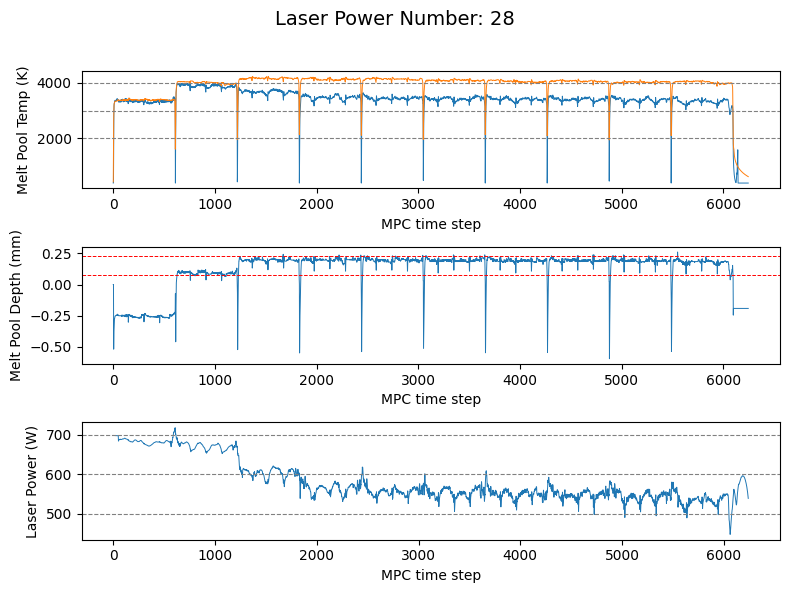

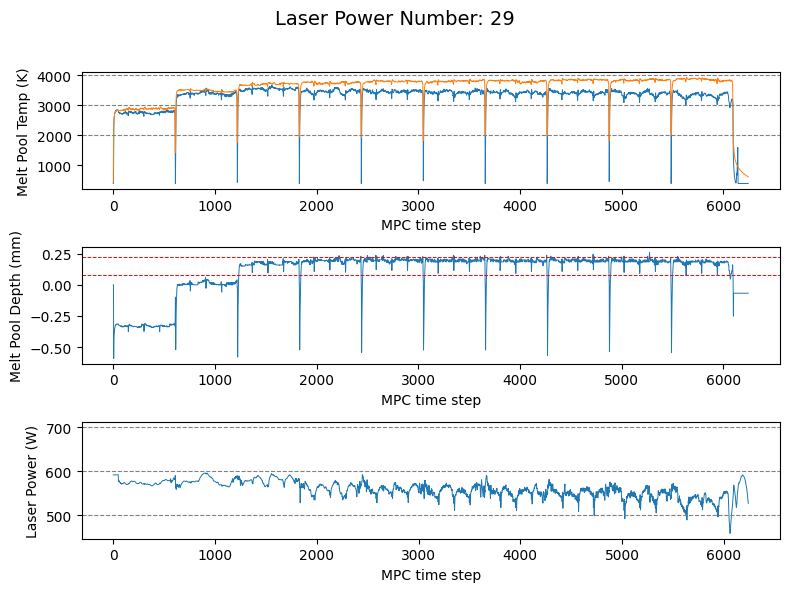

In [ ]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/3L_1024H_s1_c3_ep50_roll10_m102400_aug/simulation"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

📌 Found laser_power_numbers: [2, 3, 4]


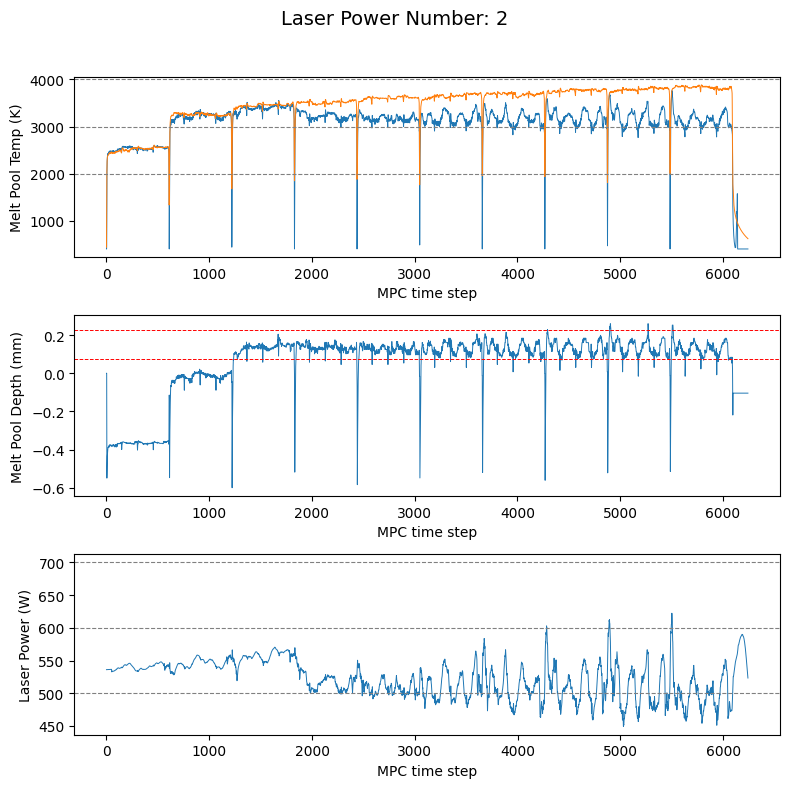

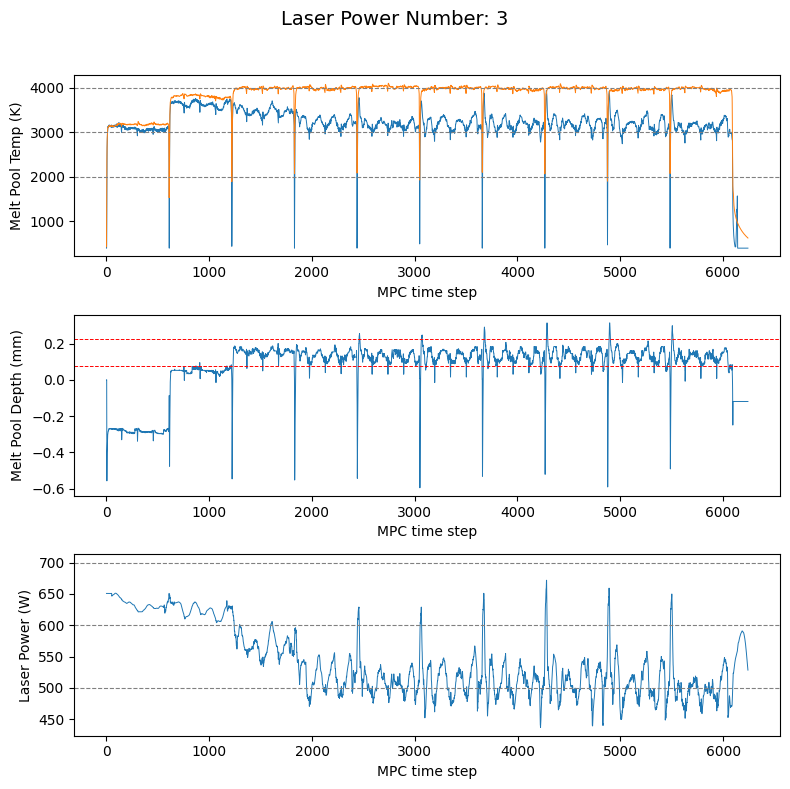

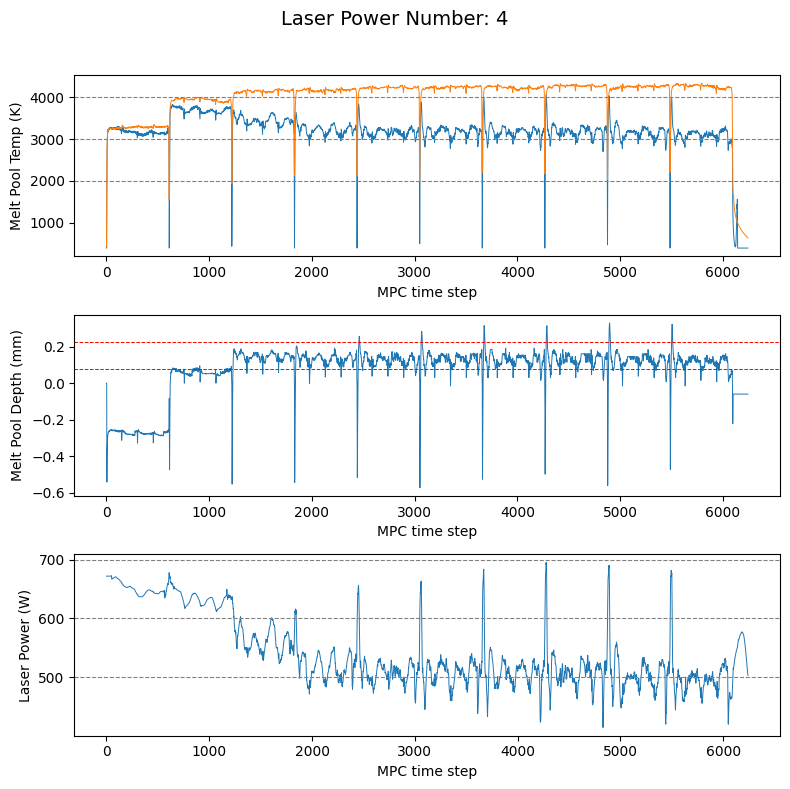

In [ ]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/lam0.05_nomc_3L_1024H_s1_c3_ep50_roll10_m102400_aug/simulation/policy_roll_epoch0009"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs(save_dir, laser_num)

In [19]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


def plot_saved_outputs_with_ci(save_dir, laser_num, N_step=None, show=True, save_png=False, dpi=150):
    x_path   = os.path.join(save_dir, f"x_outputs_laser_{laser_num}.csv")
    u_path   = os.path.join(save_dir, f"u_outputs_laser_{laser_num}.csv")
    ref_path = os.path.join(save_dir, f"ref_laser_{laser_num}.csv")
    xci_path = os.path.join(save_dir, f"x_ci_laser_{laser_num}.csv")
    uci_path = os.path.join(save_dir, f"u_ci_laser_{laser_num}.csv")

    x = pd.read_csv(x_path).values
    u = pd.read_csv(u_path).values.squeeze()
    ref = pd.read_csv(ref_path).values.squeeze()

    x_ci = pd.read_csv(xci_path) if os.path.exists(xci_path) else None
    u_ci = pd.read_csv(uci_path) if os.path.exists(uci_path) else None

    # length align
    lens = [len(x), len(u), len(ref)]
    if x_ci is not None: lens.append(len(x_ci))
    if u_ci is not None: lens.append(len(u_ci))
    T = min(lens)

    if N_step is None:
        N_step = T
    else:
        N_step = min(N_step, T)

    t = np.arange(N_step)

    # === visibility knobs ===
    BAND_ALPHA = 0.2      # 기존 0.2 → 0.35 (더 진하게)
    MID_LW = 0.5           # mid 라인 굵게
    EDGE_LW = 0.5          # low/high 경계선도 보이게
    REF_LW = 2.0
    GRID_ALPHA = 0.25

    plt.figure(figsize=(11, 7))
    plt.suptitle(f"Laser Power Number: {laser_num}", fontsize=14)

    # ---------------- 1) Temperature ----------------
    ax1 = plt.subplot(3, 1, 1)

    if x_ci is not None and {"temp_low","temp_mid","temp_high"}.issubset(x_ci.columns):
        t_low  = x_ci["temp_low"].values[:N_step]
        t_mid  = x_ci["temp_mid"].values[:N_step]
        t_high = x_ci["temp_high"].values[:N_step]

        # 밴드 + low/high 경계선 + mid
        ax1.fill_between(t, t_low, t_high, alpha=BAND_ALPHA, label="Temp CI (low~high)")
        ax1.plot(t_low,  linewidth=EDGE_LW, linestyle="--", label="Temp low")
        ax1.plot(t_high, linewidth=EDGE_LW, linestyle="--", label="Temp high")
        ax1.plot(t_mid,  linewidth=MID_LW,  label="Temp mid")
    else:
        ax1.plot(x[:N_step, 0], linewidth=MID_LW, label="GAMMA simulation (temp)")

    ax1.plot(ref[:N_step], linewidth=REF_LW, label="Reference")

    for yline in [2000, 3000, 4000]:
        ax1.axhline(y=yline, color="gray", linestyle="--", linewidth=1.0)

    ax1.set_xlabel("MPC time step")
    ax1.set_ylabel("Melt Pool Temp (K)")
    ax1.grid(True, alpha=GRID_ALPHA)
    ax1.legend(loc="best", ncol=2)

    # ---------------- 2) Depth ----------------
    ax2 = plt.subplot(3, 1, 2)

    if x_ci is not None and {"depth_low","depth_mid","depth_high"}.issubset(x_ci.columns):
        d_low  = x_ci["depth_low"].values[:N_step]
        d_mid  = x_ci["depth_mid"].values[:N_step]
        d_high = x_ci["depth_high"].values[:N_step]

        ax2.fill_between(t, d_low, d_high, alpha=BAND_ALPHA, label="Depth CI (low~high)")
        ax2.plot(d_low,  linewidth=EDGE_LW, linestyle="--", label="Depth low")
        ax2.plot(d_high, linewidth=EDGE_LW, linestyle="--", label="Depth high")
        ax2.plot(d_mid,  linewidth=MID_LW,  label="Depth mid")
    else:
        ax2.plot(x[:N_step, 1], linewidth=MID_LW, label="GAMMA simulation (depth)")

    ax2.axhline(y=0.225, linestyle="--", linewidth=2.0, label="Upper Bound")
    ax2.axhline(y=0.075, linestyle="--", linewidth=2.0, label="Lower Bound")

    ax2.set_xlabel("MPC time step")
    ax2.set_ylabel("Melt Pool Depth (mm)")
    ax2.grid(True, alpha=GRID_ALPHA)
    ax2.legend(loc="best", ncol=2)

    # ---------------- 3) Laser Power ----------------
    ax3 = plt.subplot(3, 1, 3)

    if u_ci is not None and {"u_low","u_mid","u_high"}.issubset(u_ci.columns):
        u_low  = u_ci["u_low"].values[:N_step]
        u_mid  = u_ci["u_mid"].values[:N_step]
        u_high = u_ci["u_high"].values[:N_step]

        ax3.fill_between(t, u_low, u_high, alpha=BAND_ALPHA, label="Power CI (low~high)")
        ax3.plot(u_low,  linewidth=EDGE_LW, linestyle="--", label="Power low")
        ax3.plot(u_high, linewidth=EDGE_LW, linestyle="--", label="Power high")
        ax3.plot(u_mid,  linewidth=MID_LW,  label="Power mid")
    else:
        ax3.plot(u[:N_step], linewidth=MID_LW, label="Laser Power")

    for yline in [500, 600, 700]:
        ax3.axhline(y=yline, color="gray", linestyle="--", linewidth=1.0)

    ax3.set_xlabel("MPC time step")
    ax3.set_ylabel("Laser Power (W)")
    ax3.grid(True, alpha=GRID_ALPHA)
    ax3.legend(loc="best", ncol=2)

    plt.tight_layout(rect=[0, 0, 1, 0.96])

    if save_png:
        out_png = os.path.join(save_dir, f"plot_laser_{laser_num}.png")
        plt.savefig(out_png, dpi=dpi, bbox_inches="tight")
        print(f"✅ Saved: {out_png}")

    if show:
        plt.show()
    else:
        plt.close()


In [24]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


def plot_ci_bandwidth_absdiff(save_dir, laser_num, N_step=None, show=True, save_png=False, dpi=150):
    """
    For each timestep, plot the absolute CI width: abs(high - low)
    for Temperature, Depth, and Laser Power (3 subplots).
    Requires:
      x_ci_laser_{laser_num}.csv with columns:
        temp_low,temp_high and depth_low,depth_high (mid는 필요없음)
      u_ci_laser_{laser_num}.csv with columns:
        u_low,u_high
    """

    xci_path = os.path.join(save_dir, f"x_ci_laser_{laser_num}.csv")
    uci_path = os.path.join(save_dir, f"u_ci_laser_{laser_num}.csv")

    if not os.path.exists(xci_path) and not os.path.exists(uci_path):
        raise FileNotFoundError(f"No CI files found for laser {laser_num} in {save_dir}")

    x_ci = pd.read_csv(xci_path) if os.path.exists(xci_path) else None
    u_ci = pd.read_csv(uci_path) if os.path.exists(uci_path) else None

    # length align
    lens = []
    if x_ci is not None: lens.append(len(x_ci))
    if u_ci is not None: lens.append(len(u_ci))
    T = min(lens) if lens else 0
    if T == 0:
        raise ValueError("CI data length is zero.")

    if N_step is None:
        N_step = T
    else:
        N_step = min(N_step, T)

    t = np.arange(N_step)

    # style
    LW = 1
    GRID_ALPHA = 0.25

    plt.figure(figsize=(11, 7))
    plt.suptitle(f"Laser {laser_num} | CI Width (abs(high - low))", fontsize=14)

    # ---------------- 1) Temperature CI width ----------------
    ax1 = plt.subplot(3, 1, 1)
    if x_ci is not None and {"temp_low", "temp_high"}.issubset(x_ci.columns):
        temp_low  = x_ci["temp_low"].values[:N_step]
        temp_high = x_ci["temp_high"].values[:N_step]
        temp_w = np.abs(temp_high - temp_low)
        ax1.plot(t, temp_w, linewidth=LW, label="Temp |high-low|")
    else:
        ax1.text(0.5, 0.5, "Missing temp_low/temp_high in x_ci",
                 ha="center", va="center", transform=ax1.transAxes)
    ax1.set_xlabel("MPC time step")
    ax1.set_ylabel("Temp CI width (K)")
    ax1.grid(True, alpha=GRID_ALPHA)
    ax1.legend(loc="best")

    # ---------------- 2) Depth CI width ----------------
    ax2 = plt.subplot(3, 1, 2)
    if x_ci is not None and {"depth_low", "depth_high"}.issubset(x_ci.columns):
        depth_low  = x_ci["depth_low"].values[:N_step]
        depth_high = x_ci["depth_high"].values[:N_step]
        depth_w = np.abs(depth_high - depth_low)
        ax2.plot(t, depth_w, linewidth=LW, label="Depth |high-low|")
    else:
        ax2.text(0.5, 0.5, "Missing depth_low/depth_high in x_ci",
                 ha="center", va="center", transform=ax2.transAxes)
    ax2.set_xlabel("MPC time step")
    ax2.set_ylabel("Depth CI width (mm)")
    ax2.grid(True, alpha=GRID_ALPHA)
    ax2.legend(loc="best")

    # ---------------- 3) Power CI width ----------------
    ax3 = plt.subplot(3, 1, 3)
    if u_ci is not None and {"u_low", "u_high"}.issubset(u_ci.columns):
        u_low  = u_ci["u_low"].values[:N_step]
        u_high = u_ci["u_high"].values[:N_step]
        u_w = np.abs(u_high - u_low)
        ax3.plot(t, u_w, linewidth=LW, label="Power |high-low|")
    else:
        ax3.text(0.5, 0.5, "Missing u_low/u_high in u_ci",
                 ha="center", va="center", transform=ax3.transAxes)
    ax3.set_xlabel("MPC time step")
    ax3.set_ylabel("Power CI width (W)")
    ax3.grid(True, alpha=GRID_ALPHA)
    ax3.legend(loc="best")

    plt.tight_layout(rect=[0, 0, 1, 0.96])

    if save_png:
        out_png = os.path.join(save_dir, f"plot_ci_width_laser_{laser_num}.png")
        plt.savefig(out_png, dpi=dpi, bbox_inches="tight")
        print(f"✅ Saved: {out_png}")

    if show:
        plt.show()
    else:
        plt.close()


# 예시 사용:
# plot_ci_bandwidth_absdiff("./saved_outputs", laser_num=1, N_step=200, save_png=True)


📌 Found laser_power_numbers: [2, 3, 4, 5, 6, 7, 8, 9, 10]


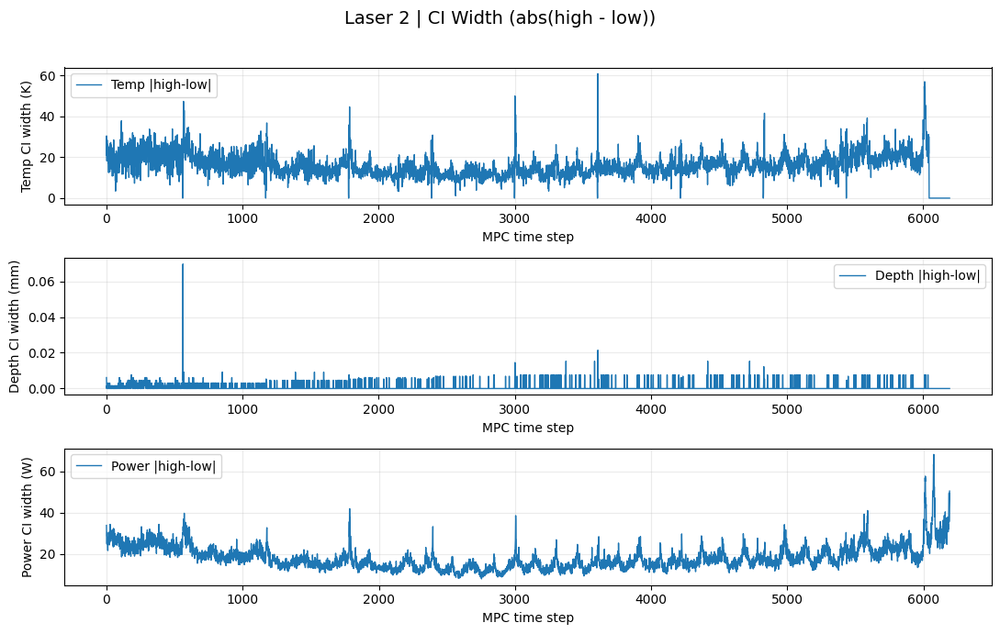

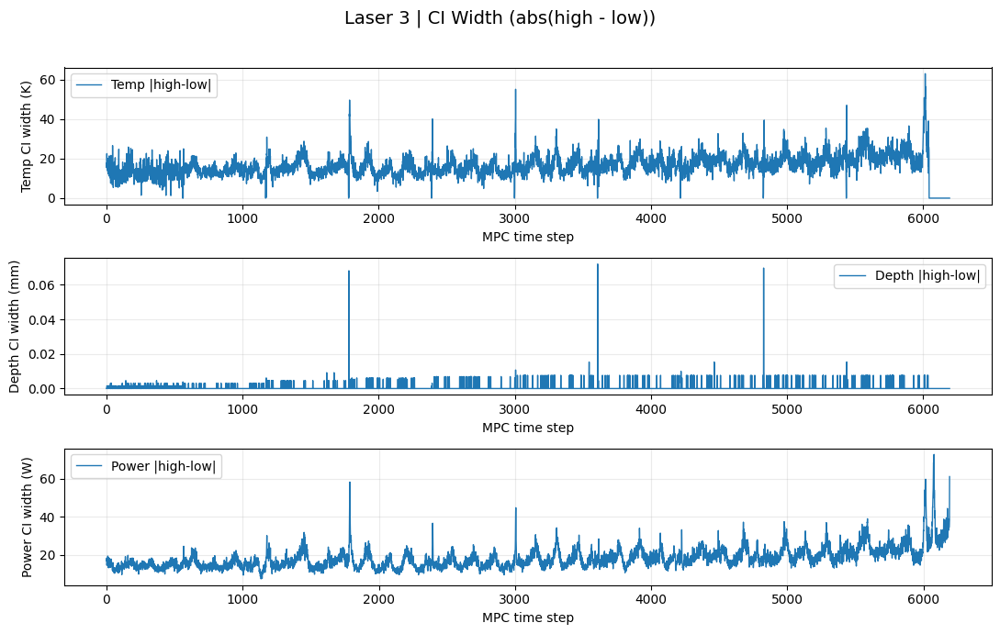

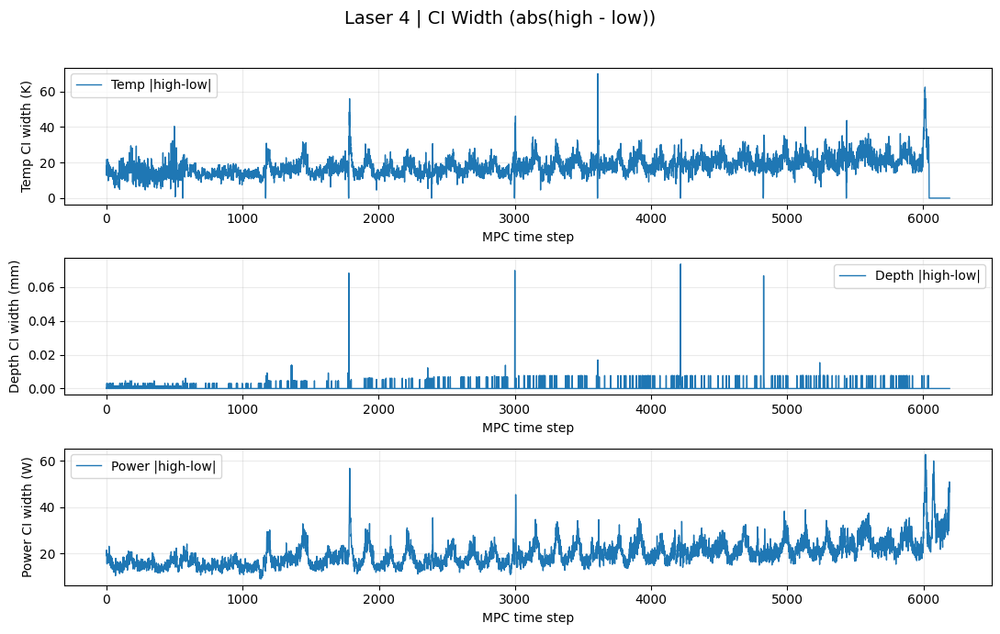

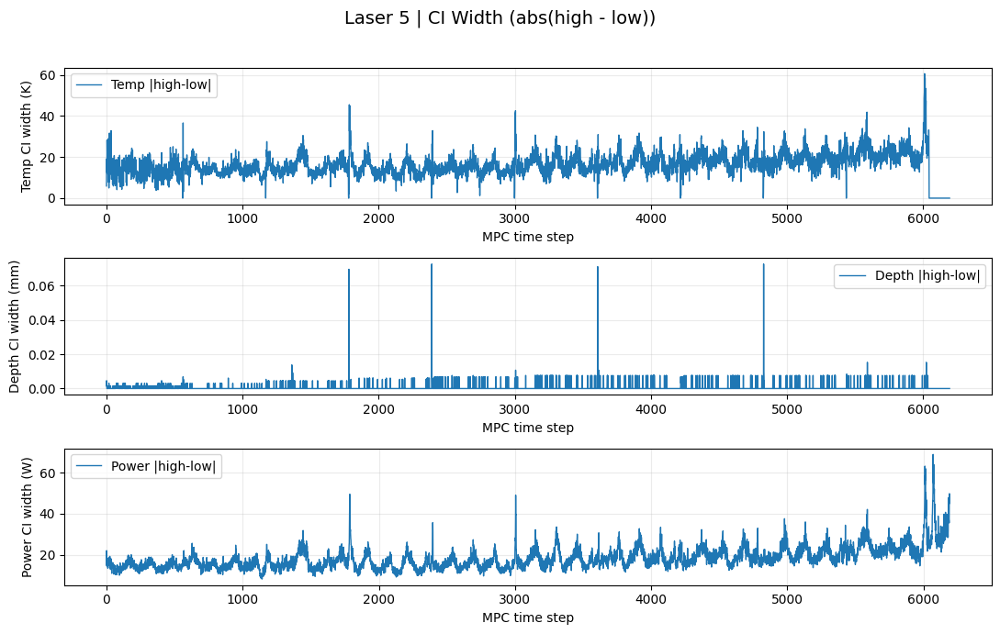

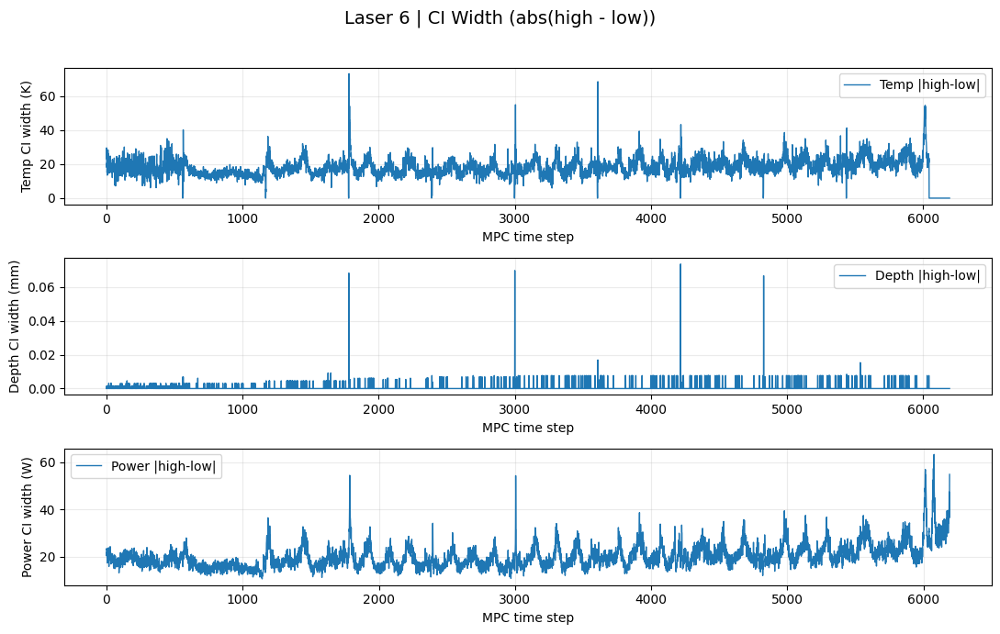

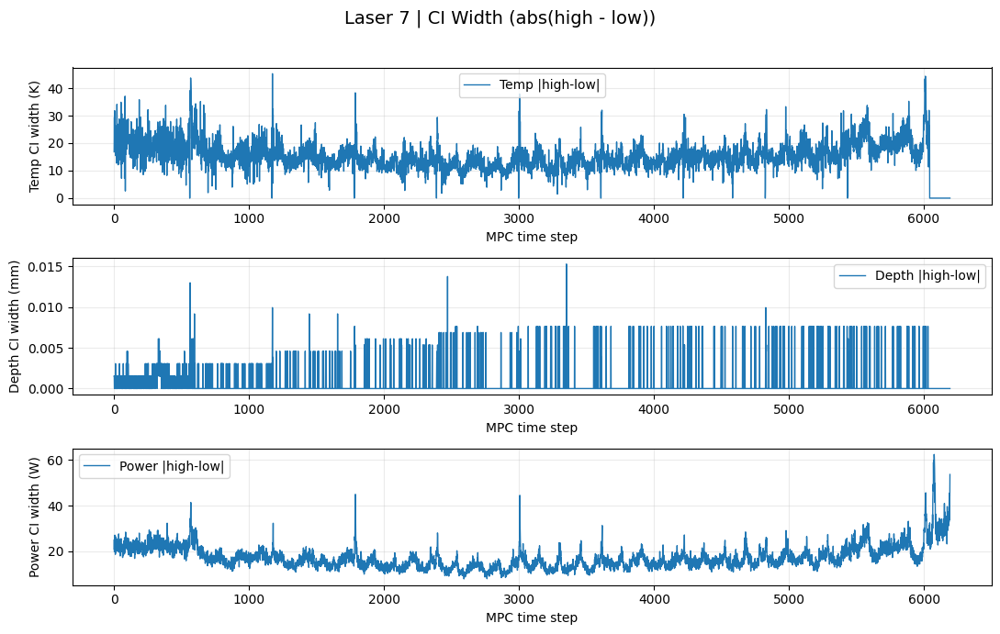

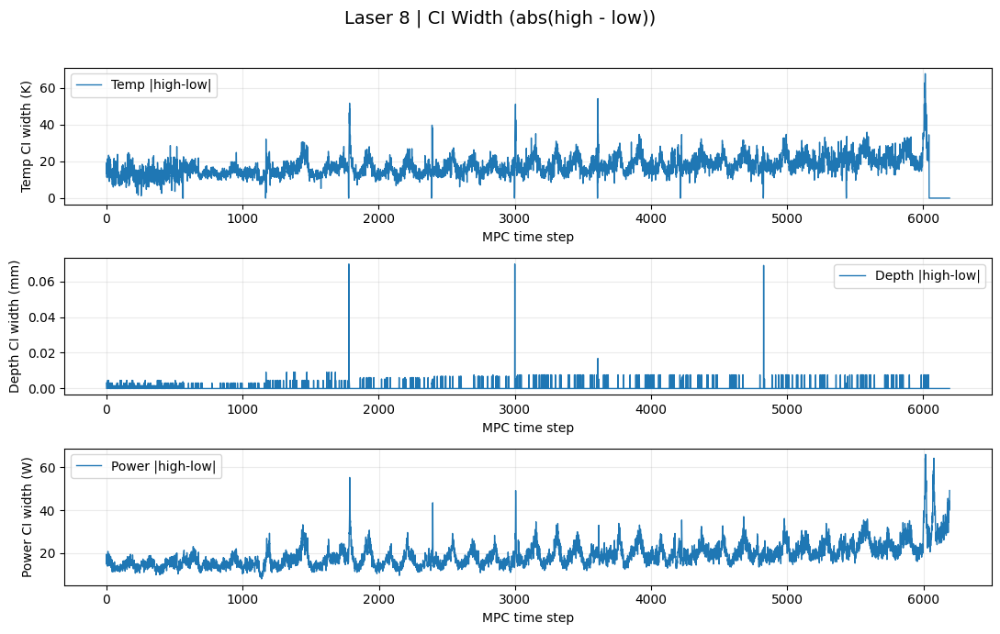

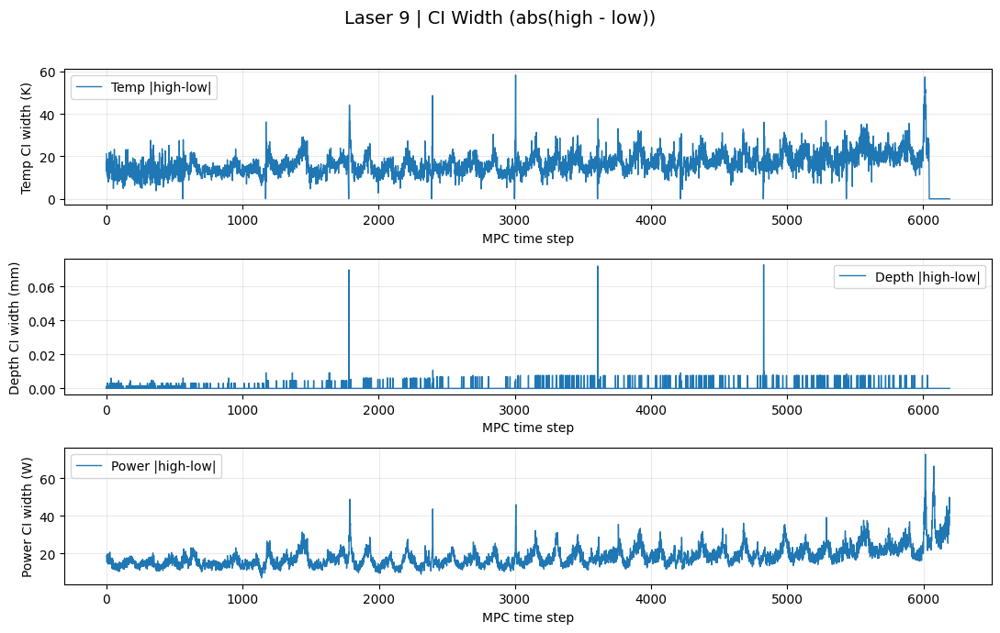

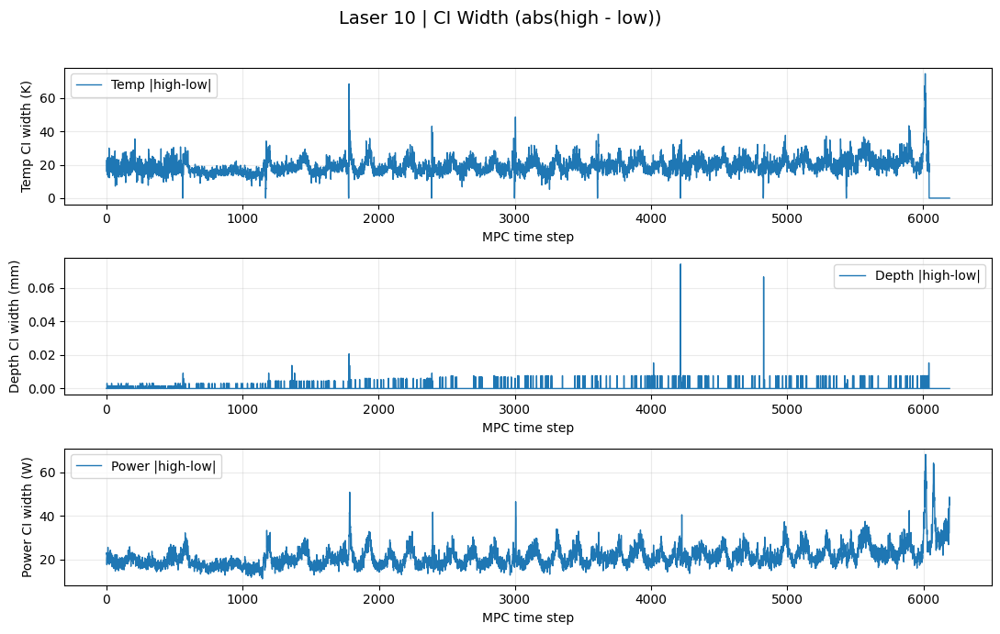

In [25]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/3L_1024H_s1_c3_ep50_roll10_m102400_aug/simulation_uncertainty"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_ci_bandwidth_absdiff(save_dir, laser_num)

📌 Found laser_power_numbers: [2, 3, 4, 5, 6, 7, 8, 9, 10]


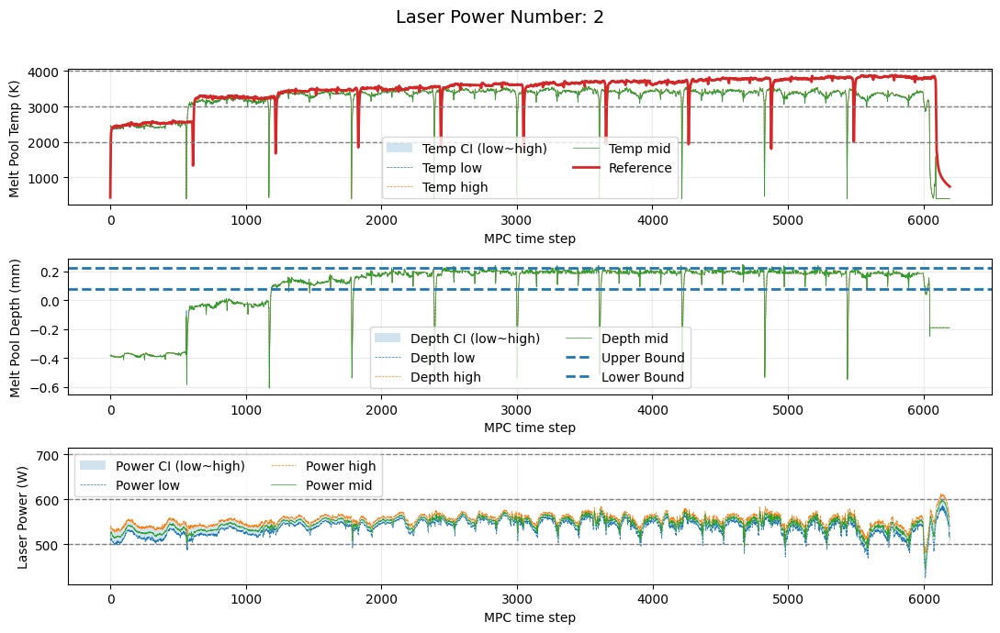

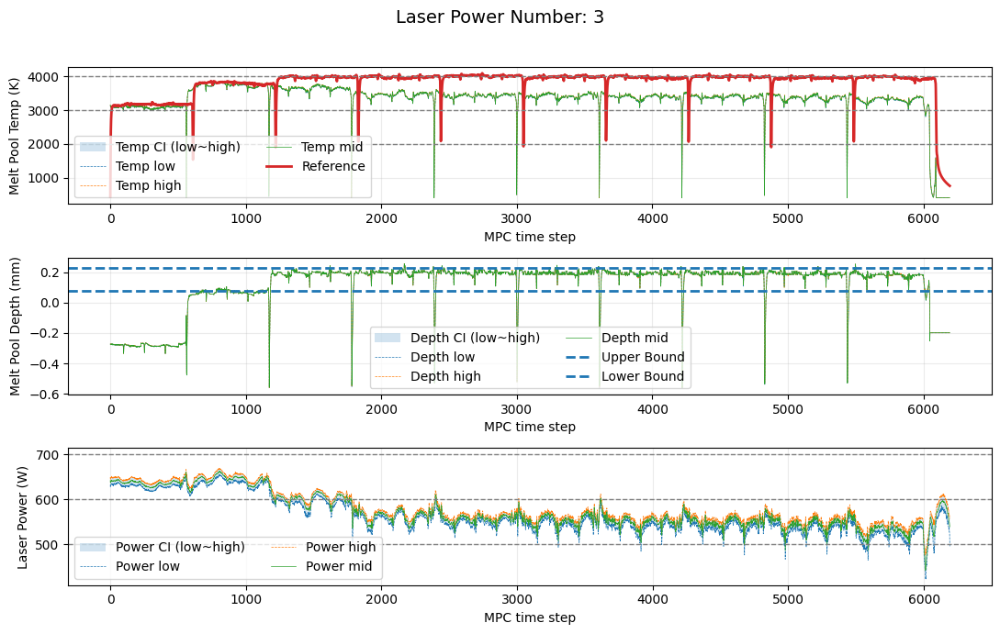

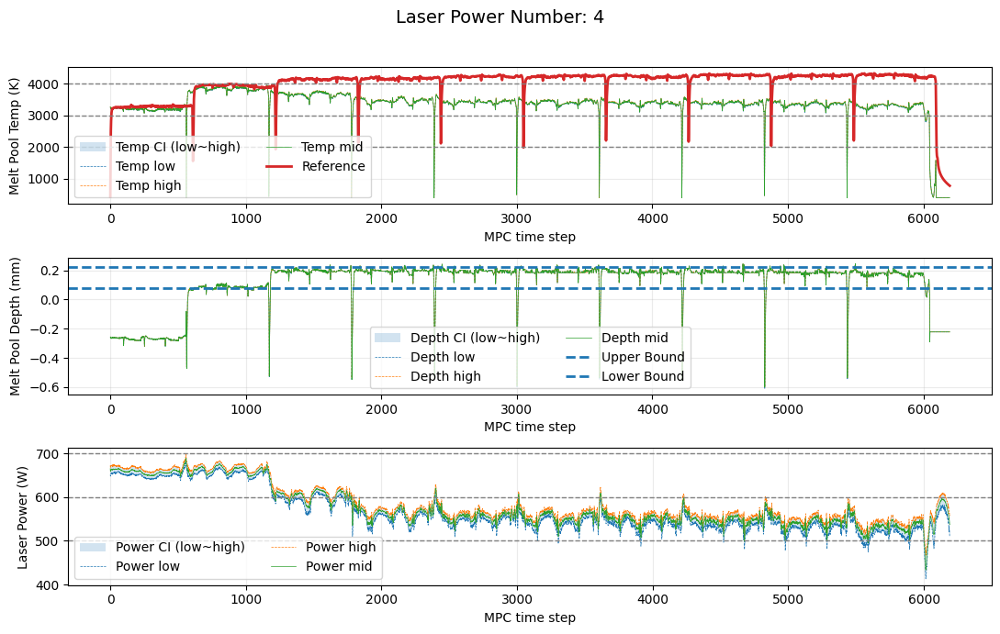

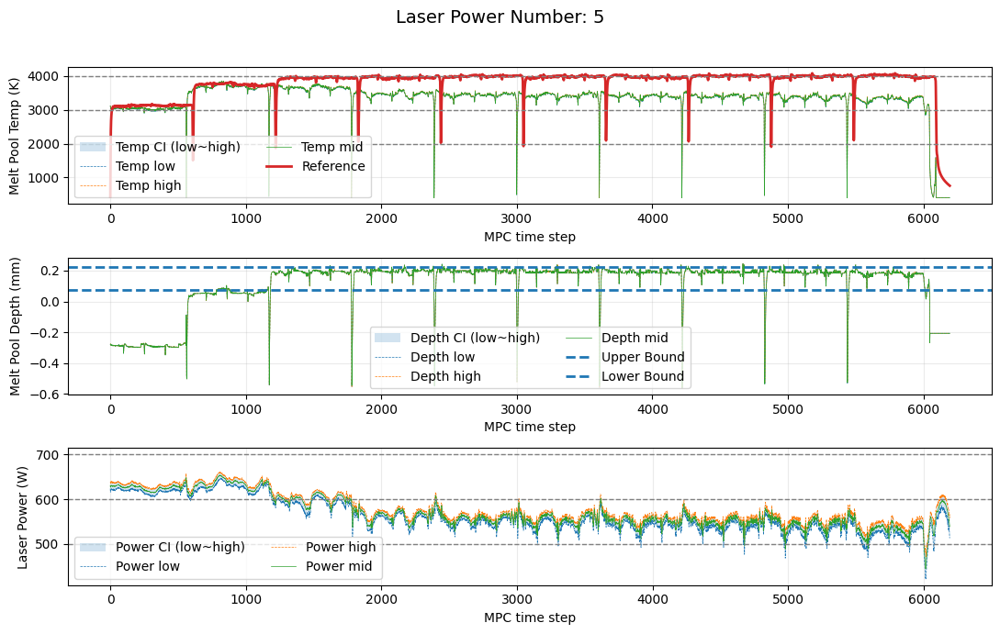

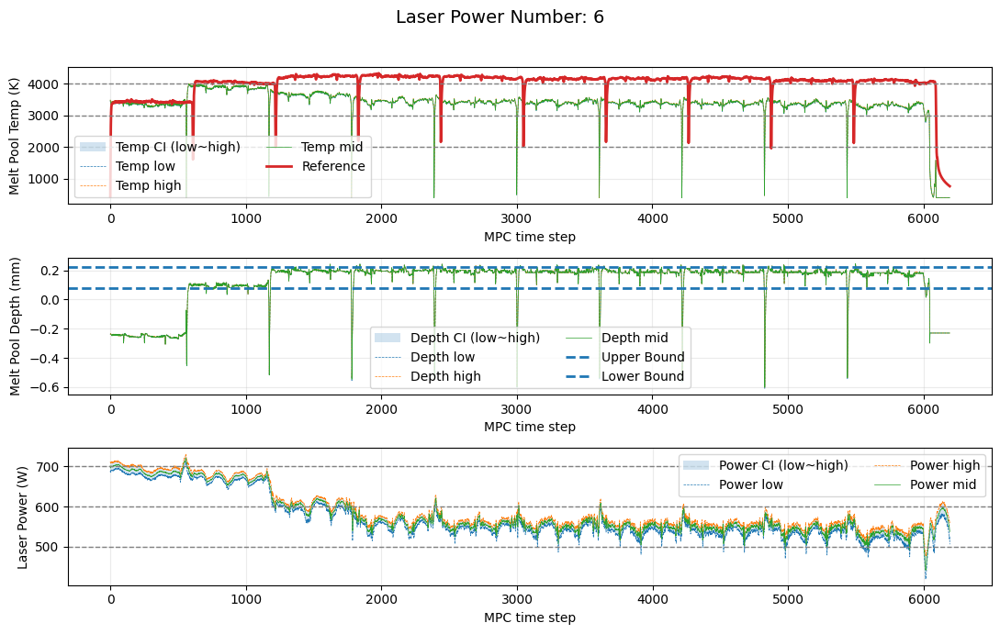

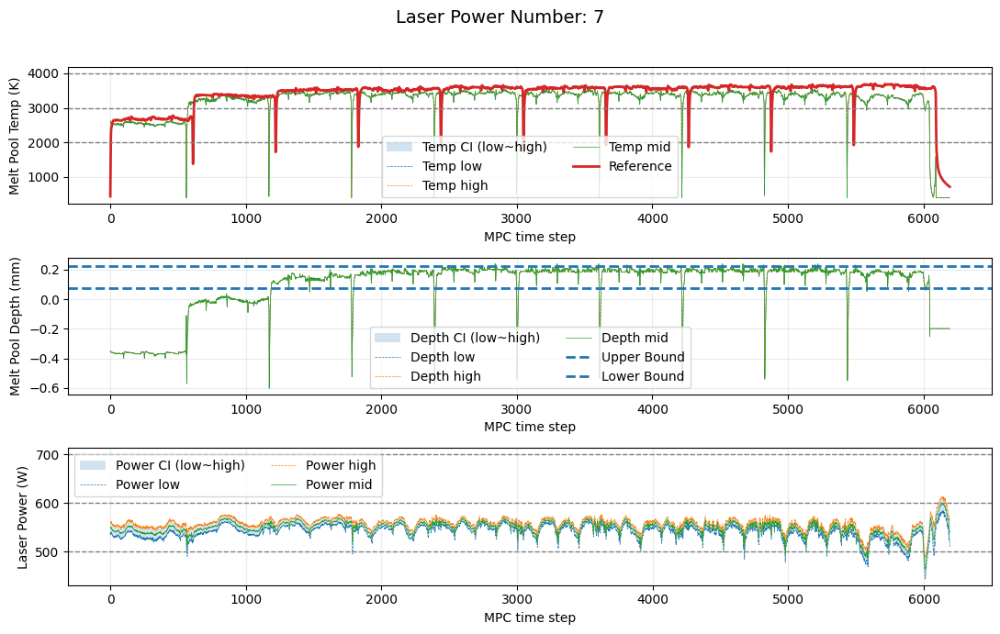

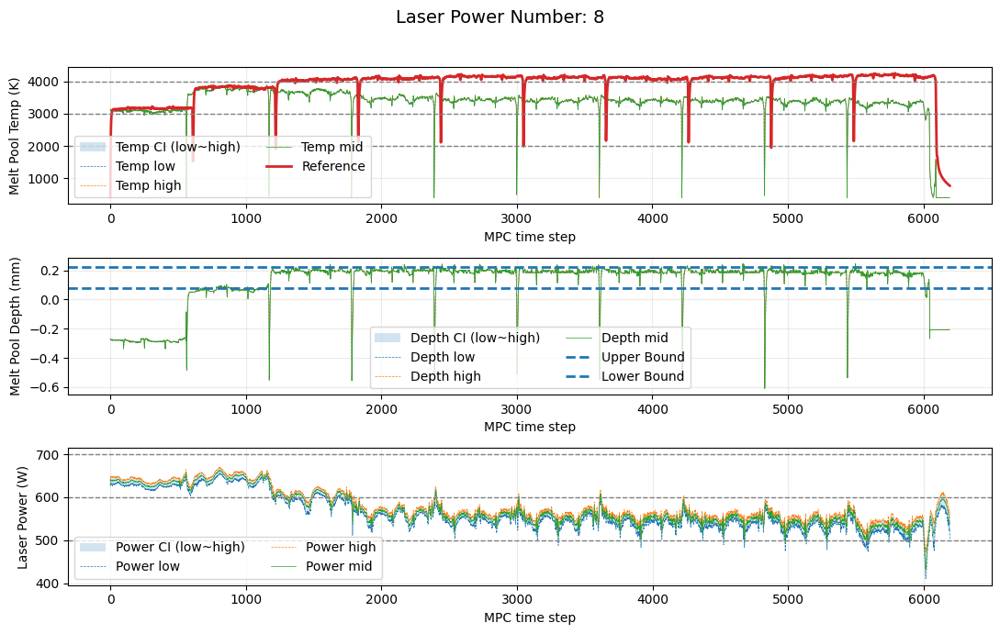

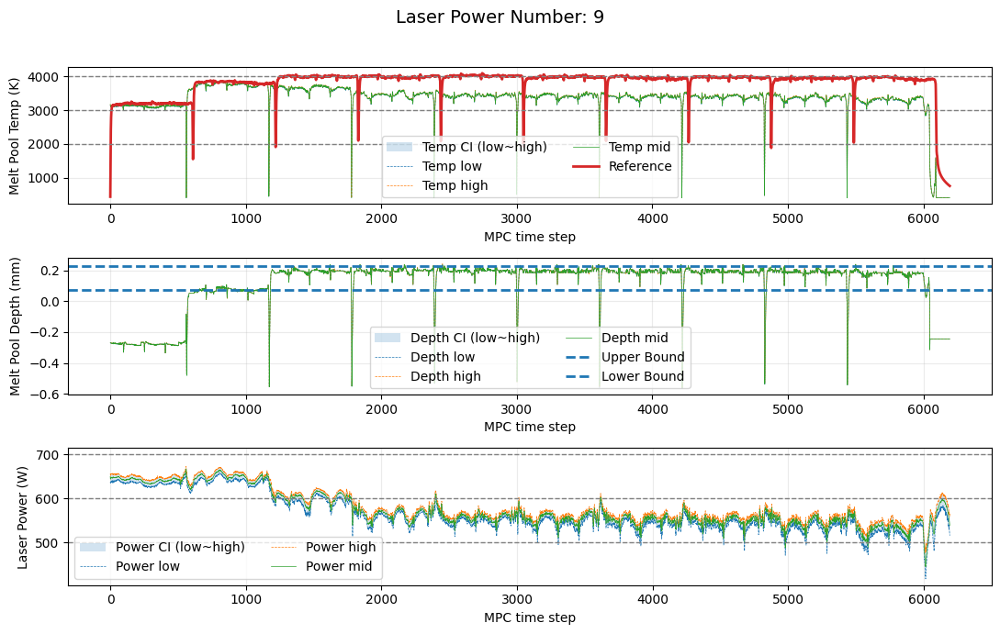

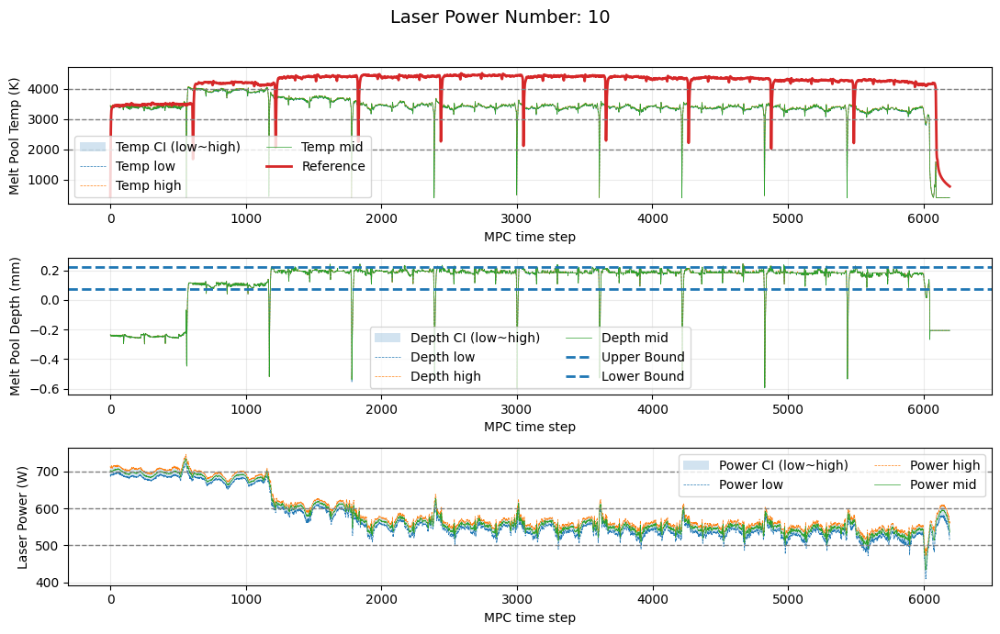

In [20]:
# ── Main Loop ───────────────────────────────────────────────
save_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/3L_1024H_s1_c3_ep50_roll10_m102400_aug/simulation_uncertainty"

# Find laser_power_numbers
all_files = os.listdir(save_dir)
laser_nums = sorted(set(
    int(re.search(r"(\d+)", f).group(1))
    for f in all_files if f.startswith("x_outputs_laser_")
))

print(f"📌 Found laser_power_numbers: {laser_nums}")

# Plot all
for laser_num in laser_nums:
    plot_saved_outputs_with_ci(save_dir, laser_num)